<p style="font-size:36px;text-align:center"> <b>Personalized cancer diagnosis</b> </p>

<h1>1. Business Problem</h1>

<h2>1.1. Description</h2>

<p> Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment/ </p>
<p> Data: Memorial Sloan Kettering Cancer Center (MSKCC)</p>
<p> Download training_variants.zip and training_text.zip from Kaggle.</p> 

<h6> Context:</h6>
<p> Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment/discussion/35336#198462</p>

<h6> Problem statement : </h6>
<p> Classify the given genetic variations/mutations based on evidence from text-based clinical literature. </p>

<h2>1.2. Source/Useful Links</h2>

 Some articles and reference blogs about the problem statement

1. https://www.forbes.com/sites/matthewherper/2017/06/03/a-new-cancer-drug-helped-almost-everyone-who-took-it-almost-heres-what-it-teaches-us/#2a44ee2f6b25
2. https://www.youtube.com/watch?v=UwbuW7oK8rk 
3. https://www.youtube.com/watch?v=qxXRKVompI8

<h2>1.3. Real-world/Business objectives and constraints.</h2>

* No low-latency requirement.
* Interpretability is important.
* Errors can be very costly.
* Probability of a data-point belonging to each class is needed.

<h1>2. Machine Learning Problem Formulation</h1>

<h2>2.1. Data</h2>

<h3>2.1.1. Data Overview</h3>

- Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment/data
- We have two data files: one conatins the information about the genetic mutations and the other contains the clinical evidence (text) that  human experts/pathologists use to classify the genetic mutations. 
- Both these data files are have a common column called ID
- <p> 
    Data file's information:
    <ul> 
        <li>
        training_variants (ID , Gene, Variations, Class)
        </li>
        <li>
        training_text (ID, Text)
        </li>
    </ul>
</p>

<h3>2.1.2. Example Data Point</h3>

<h6>training_variants</h6>
<hr>
ID,Gene,Variation,Class<br>
0,FAM58A,Truncating Mutations,1 <br>
1,CBL,W802*,2 <br>
2,CBL,Q249E,2 <br>
...

<h6> training_text</h6>
<hr>
ID,Text <br>
0||Cyclin-dependent kinases (CDKs) regulate a variety of fundamental cellular processes. CDK10 stands out as one of the last orphan CDKs for which no activating cyclin has been identified and no kinase activity revealed. Previous work has shown that CDK10 silencing increases ETS2 (v-ets erythroblastosis virus E26 oncogene homolog 2)-driven activation of the MAPK pathway, which confers tamoxifen resistance to breast cancer cells. The precise mechanisms by which CDK10 modulates ETS2 activity, and more generally the functions of CDK10, remain elusive. Here we demonstrate that CDK10 is a cyclin-dependent kinase by identifying cyclin M as an activating cyclin. Cyclin M, an orphan cyclin, is the product of FAM58A, whose mutations cause STAR syndrome, a human developmental anomaly whose features include toe syndactyly, telecanthus, and anogenital and renal malformations. We show that STAR syndrome-associated cyclin M mutants are unable to interact with CDK10. Cyclin M silencing phenocopies CDK10 silencing in increasing c-Raf and in conferring tamoxifen resistance to breast cancer cells. CDK10/cyclin M phosphorylates ETS2 in vitro, and in cells it positively controls ETS2 degradation by the proteasome. ETS2 protein levels are increased in cells derived from a STAR patient, and this increase is attributable to decreased cyclin M levels. Altogether, our results reveal an additional regulatory mechanism for ETS2, which plays key roles in cancer and development. They also shed light on the molecular mechanisms underlying STAR syndrome.Cyclin-dependent kinases (CDKs) play a pivotal role in the control of a number of fundamental cellular processes (1). The human genome contains 21 genes encoding proteins that can be considered as members of the CDK family owing to their sequence similarity with bona fide CDKs, those known to be activated by cyclins (2). Although discovered almost 20 y ago (3, 4), CDK10 remains one of the two CDKs without an identified cyclin partner. This knowledge gap has largely impeded the exploration of its biological functions. CDK10 can act as a positive cell cycle regulator in some cells (5, 6) or as a tumor suppressor in others (7, 8). CDK10 interacts with the ETS2 (v-ets erythroblastosis virus E26 oncogene homolog 2) transcription factor and inhibits its transcriptional activity through an unknown mechanism (9). CDK10 knockdown derepresses ETS2, which increases the expression of the c-Raf protein kinase, activates the MAPK pathway, and induces resistance of MCF7 cells to tamoxifen (6). ... 

<h2>2.2. Mapping the real-world problem to an ML problem</h2>

<h3>2.2.1. Type of Machine Learning Problem</h3>

<p>
    
            There are nine different classes a genetic mutation can be classified into => Multi class classification problem
   
      
    
</p>

<h3>2.2.2. Performance Metric</h3>

Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment#evaluation

Metric(s): 
* Multi class log-loss 
* Confusion matrix 


<h3>2.2.3. Machine Learing Objectives and Constraints</h3>

<p> Objective: Predict the probability of each data-point belonging to each of the nine classes.
</p>
<p> Constraints:
</p>
* Interpretability
* Class probabilities are needed.
* Penalize the errors in class probabilites => Metric is Log-loss.
* No Latency constraints.

<h2>2.3. Train, CV and Test Datasets</h2>

 Split the dataset randomly into three parts train, cross validation and test with 64%,16%, 20% of data respectively

<h1>3. Exploratory Data Analysis</h1>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from collections import Counter
from scipy.sparse import hstack
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.cross_validation import StratifiedKFold 
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings("ignore")

from mlxtend.classifier import StackingClassifier

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


<h2>3.1. Reading Data</h2>

<h3>3.1.1. Reading Gene and Variation Data</h3>

In [2]:
data = pd.read_csv('training_variants')
print('Number of data points : ', data.shape[0])
print('Number of features : ', data.shape[1])
print('Features : ', data.columns.values)
data.head()

Number of data points :  3321
Number of features :  4
Features :  ['ID' 'Gene' 'Variation' 'Class']


,ID,Gene,Variation,Class
0,0,FAM58A,Truncating Mutations,1
1,1,CBL,W802*,2
2,2,CBL,Q249E,2
3,3,CBL,N454D,3
4,4,CBL,L399V,4


<p>
    training/training_variants is a comma separated file containing the description of the genetic mutations used for training. <br>
    Fields are 
    <ul>
        <li><b>ID : </b>the id of the row used to link the mutation to the clinical evidence</li>
        <li><b>Gene : </b>the gene where this genetic mutation is located </li>
        <li><b>Variation : </b>the aminoacid change for this mutations </li>
        <li><b>Class :</b> 1-9 the class this genetic mutation has been classified on</li>
    </ul>

<h3>3.1.2. Reading Text Data</h3>

In [3]:
# note the seprator in this file
data_text =pd.read_csv("training_text",sep="\|\|",engine="python",names=["ID","TEXT"],skiprows=1)
print('Number of data points : ', data_text.shape[0])
print('Number of features : ', data_text.shape[1])
print('Features : ', data_text.columns.values)
data_text.head()

Number of data points :  3321
Number of features :  2
Features :  ['ID' 'TEXT']


,ID,TEXT
0,0,Cyclin-dependent kinases (CDKs) regulate a var...
1,1,Abstract Background Non-small cell lung canc...
2,2,Abstract Background Non-small cell lung canc...
3,3,Recent evidence has demonstrated that acquired...
4,4,Oncogenic mutations in the monomeric Casitas B...


<h3>3.1.3. Preprocessing of text</h3>

In [4]:
# loading stop words from nltk library
stop_words = set(stopwords.words('english'))


def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        # replace every special char with space
        total_text = re.sub('[^a-zA-Z0-9\n]', ' ', total_text)
        # replace multiple spaces with single space
        total_text = re.sub('\s+',' ', total_text)
        # converting all the chars into lower-case.
        total_text = total_text.lower()
        
        for word in total_text.split():
        # if the word is a not a stop word then retain that word from the data
            if not word in stop_words:
                string += word + " "
        
        data_text[column][index] = string

In [5]:
#text processing stage.
from tqdm import tqdm
for index, row in tqdm(data_text.iterrows()):
    if type(row['TEXT']) is str:
        nlp_preprocessing(row['TEXT'], index, 'TEXT')
    else:
        print("there is no text description for id:",index)


1108it [00:57, 19.11it/s]

there is no text description for id: 1109


1276it [01:06, 20.91it/s]

there is no text description for id: 1277


1406it [01:13, 21.19it/s]

there is no text description for id: 1407


1637it [01:25, 20.51it/s]

there is no text description for id: 1639


2754it [02:22, 17.69it/s]

there is no text description for id: 2755


3321it [02:51, 20.42it/s]


In [6]:
#merging both gene_variations and text data based on ID
result = pd.merge(data, data_text,on='ID', how='left')
result.head()

,ID,Gene,Variation,Class,TEXT
0,0,FAM58A,Truncating Mutations,1,cyclin dependent kinases cdks regulate variety...
1,1,CBL,W802*,2,abstract background non small cell lung cancer...
2,2,CBL,Q249E,2,abstract background non small cell lung cancer...
3,3,CBL,N454D,3,recent evidence demonstrated acquired uniparen...
4,4,CBL,L399V,4,oncogenic mutations monomeric casitas b lineag...


In [7]:
result[result.isnull().any(axis=1)]

,ID,Gene,Variation,Class,TEXT
1109,1109,FANCA,S1088F,1,NaN
1277,1277,ARID5B,Truncating Mutations,1,NaN
1407,1407,FGFR3,K508M,6,NaN
1639,1639,FLT1,Amplification,6,NaN
2755,2755,BRAF,G596C,7,NaN


### Replace NaN with Gene+ Variation as Text

In [8]:
result.loc[result['TEXT'].isnull(),'TEXT'] = result['Gene'] +' '+result['Variation']

In [9]:
result[result['ID']==1109]

,ID,Gene,Variation,Class,TEXT
1109,1109,FANCA,S1088F,1,FANCA S1088F


<h3>3.1.4. Test, Train and Cross Validation Split</h3>

<h4>3.1.4.1. Splitting data into train, test and cross validation (64:20:16)</h4>

In [10]:
y_true = result['Class'].values
result.Gene      = result.Gene.str.replace('\s+', '_')
result.Variation = result.Variation.str.replace('\s+', '_')

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(result, y_true, stratify=y_true, test_size=0.2)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

<p> We split the data into train, test and cross validation data sets, preserving the ratio of class distribution in the original data set  </p>

In [11]:
print('Number of data points in train data:', train_df.shape[0])
print('Number of data points in test data:', test_df.shape[0])
print('Number of data points in cross validation data:', cv_df.shape[0])

Number of data points in train data: 2124
Number of data points in test data: 665
Number of data points in cross validation data: 532


<h4>3.1.4.2. Distribution of y_i's in Train, Test and Cross Validation datasets</h4>

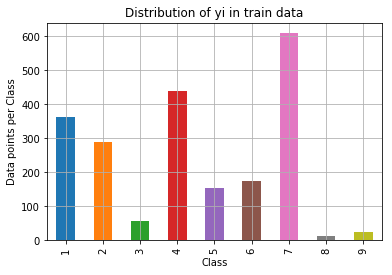

Number of data points in class 7 : 609 ( 28.672 %)
Number of data points in class 4 : 439 ( 20.669 %)
Number of data points in class 1 : 363 ( 17.09 %)
Number of data points in class 2 : 289 ( 13.606 %)
Number of data points in class 6 : 176 ( 8.286 %)
Number of data points in class 5 : 155 ( 7.298 %)
Number of data points in class 3 : 57 ( 2.684 %)
Number of data points in class 9 : 24 ( 1.13 %)
Number of data points in class 8 : 12 ( 0.565 %)
--------------------------------------------------------------------------------


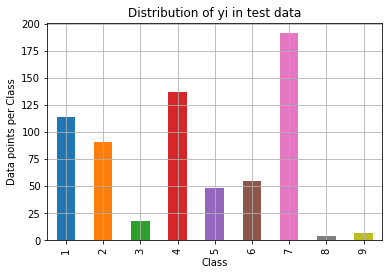

Number of data points in class 7 : 191 ( 28.722 %)
Number of data points in class 4 : 137 ( 20.602 %)
Number of data points in class 1 : 114 ( 17.143 %)
Number of data points in class 2 : 91 ( 13.684 %)
Number of data points in class 6 : 55 ( 8.271 %)
Number of data points in class 5 : 48 ( 7.218 %)
Number of data points in class 3 : 18 ( 2.707 %)
Number of data points in class 9 : 7 ( 1.053 %)
Number of data points in class 8 : 4 ( 0.602 %)
--------------------------------------------------------------------------------


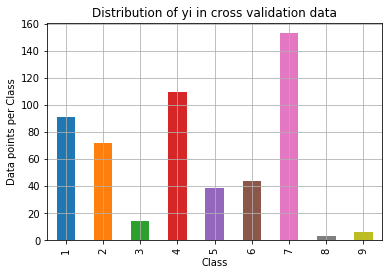

Number of data points in class 7 : 153 ( 28.759 %)
Number of data points in class 4 : 110 ( 20.677 %)
Number of data points in class 1 : 91 ( 17.105 %)
Number of data points in class 2 : 72 ( 13.534 %)
Number of data points in class 6 : 44 ( 8.271 %)
Number of data points in class 5 : 39 ( 7.331 %)
Number of data points in class 3 : 14 ( 2.632 %)
Number of data points in class 9 : 6 ( 1.128 %)
Number of data points in class 8 : 3 ( 0.564 %)


In [12]:
# it returns a dict, keys as class labels and values as the number of data points in that class
train_class_distribution = train_df['Class'].value_counts().sortlevel()
test_class_distribution = test_df['Class'].value_counts().sortlevel()
cv_class_distribution = cv_df['Class'].value_counts().sortlevel()

my_colors = 'rgbkymc'
train_class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in train data')
plt.grid()
plt.show()

# ref: argsort https://docs.scipy.org/doc/numpy/reference/generated/numpy.argsort.html
# -(train_class_distribution.values): the minus sign will give us in decreasing order
sorted_yi = np.argsort(-train_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_class_distribution.values[i], '(', np.round((train_class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')

    
print('-'*80)
my_colors = 'rgbkymc'
test_class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in test data')
plt.grid()
plt.show()

# ref: argsort https://docs.scipy.org/doc/numpy/reference/generated/numpy.argsort.html
# -(train_class_distribution.values): the minus sign will give us in decreasing order
sorted_yi = np.argsort(-test_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',test_class_distribution.values[i], '(', np.round((test_class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')

print('-'*80)
my_colors = 'rgbkymc'
cv_class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in cross validation data')
plt.grid()
plt.show()

# ref: argsort https://docs.scipy.org/doc/numpy/reference/generated/numpy.argsort.html
# -(train_class_distribution.values): the minus sign will give us in decreasing order
sorted_yi = np.argsort(-train_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',cv_class_distribution.values[i], '(', np.round((cv_class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')


<h2>3.2 Prediction using a 'Random' Model</h2>

<p style="font-size:16px"> In a 'Random' Model, we generate the NINE class probabilites randomly such that they sum to 1. </p>

In [13]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    
    labels = [1,2,3,4,5,6,7,8,9]
    # representing A in heatmap format
    print("-"*20, "Confusion matrix", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*20, "Precision matrix (Columm Sum=1)", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(B, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    
    # representing B in heatmap format
    print("-"*20, "Recall matrix (Row sum=1)", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

Log loss on Cross Validation Data using Random Model 2.5016216367560298
Log loss on Test Data using Random Model 2.512724570845187
-------------------- Confusion matrix --------------------


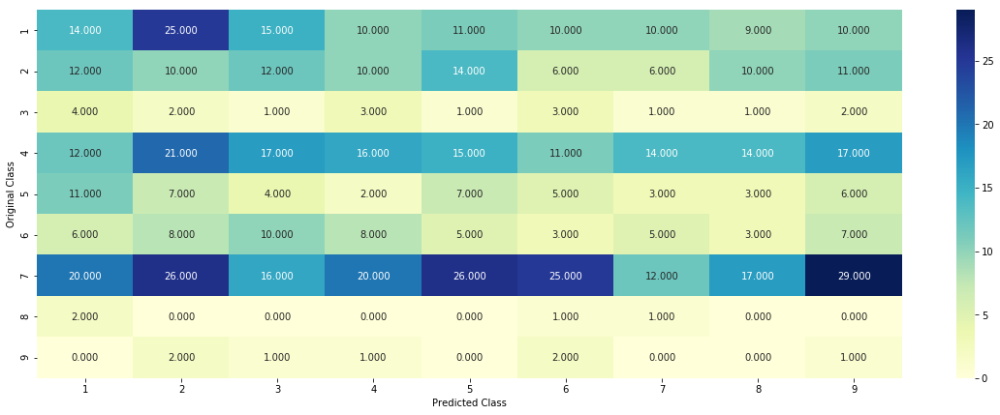

-------------------- Precision matrix (Columm Sum=1) --------------------


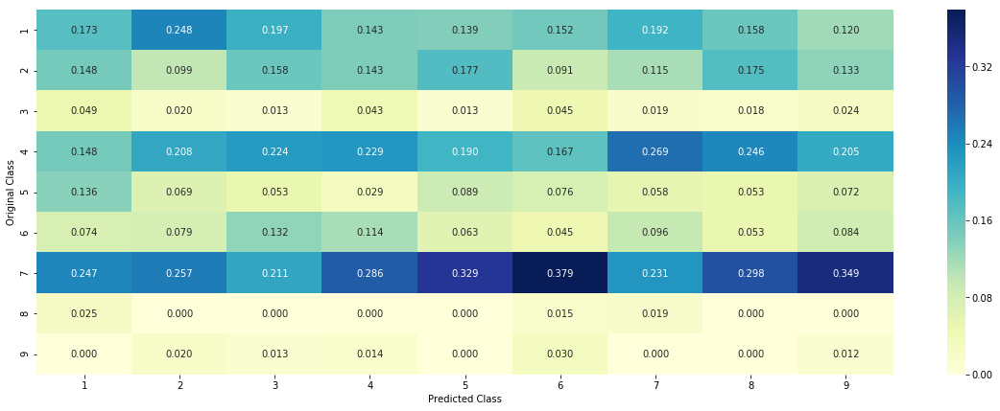

-------------------- Recall matrix (Row sum=1) --------------------


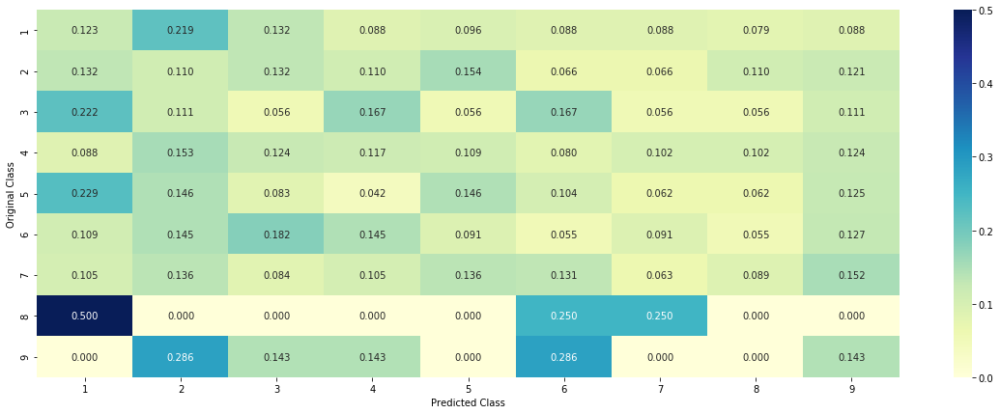

In [14]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
test_data_len = test_df.shape[0]
cv_data_len = cv_df.shape[0]


# we create a output array that has exactly same size as the CV data
cv_predicted_y = np.zeros((cv_data_len,9))
for i in range(cv_data_len):
    rand_probs = np.random.rand(1,9)
    cv_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Cross Validation Data using Random Model",log_loss(y_cv,cv_predicted_y, eps=1e-15))


# Test-Set error.
#we create a output array that has exactly same as the test data
test_predicted_y = np.zeros((test_data_len,9))
for i in range(test_data_len):
    rand_probs = np.random.rand(1,9)
    test_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test,test_predicted_y, eps=1e-15))

predicted_y =np.argmax(test_predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y+1)

<h2>3.3 Univariate Analysis</h2>

In [15]:
# code for response coding with Laplace smoothing.
# alpha : used for laplace smoothing
# feature: ['gene', 'variation']
# df: ['train_df', 'test_df', 'cv_df']
# algorithm
# ----------
# Consider all unique values and the number of occurances of given feature in train data dataframe
# build a vector (1*9) , the first element = (number of times it occured in class1 + 10*alpha / number of time it occurred in total data+90*alpha)
# gv_dict is like a look up table, for every gene it store a (1*9) representation of it
# for a value of feature in df:
# if it is in train data:
# we add the vector that was stored in 'gv_dict' look up table to 'gv_fea'
# if it is not there is train:
# we add [1/9, 1/9, 1/9, 1/9,1/9, 1/9, 1/9, 1/9, 1/9] to 'gv_fea'
# return 'gv_fea'
# ----------------------

# get_gv_fea_dict: Get Gene varaition Feature Dict
def get_gv_fea_dict(alpha, feature, df):
    # value_count: it contains a dict like
    # print(train_df['Gene'].value_counts())
    # output:
    #        {BRCA1      174
    #         TP53       106
    #         EGFR        86
    #         BRCA2       75
    #         PTEN        69
    #         KIT         61
    #         BRAF        60
    #         ERBB2       47
    #         PDGFRA      46
    #         ...}
    # print(train_df['Variation'].value_counts())
    # output:
    # {
    # Truncating_Mutations                     63
    # Deletion                                 43
    # Amplification                            43
    # Fusions                                  22
    # Overexpression                            3
    # E17K                                      3
    # Q61L                                      3
    # S222D                                     2
    # P130S                                     2
    # ...
    # }
    value_count = train_df[feature].value_counts()
    
    # gv_dict : Gene Variation Dict, which contains the probability array for each gene/variation
    gv_dict = dict()
    
    # denominator will contain the number of time that particular feature occured in whole data
    for i, denominator in value_count.items():
        # vec will contain (p(yi==1/Gi) probability of gene/variation belongs to perticular class
        # vec is 9 diamensional vector
        vec = []
        for k in range(1,10):
            # print(train_df.loc[(train_df['Class']==1) & (train_df['Gene']=='BRCA1')])
            #         ID   Gene             Variation  Class  
            # 2470  2470  BRCA1                S1715C      1   
            # 2486  2486  BRCA1                S1841R      1   
            # 2614  2614  BRCA1                   M1R      1   
            # 2432  2432  BRCA1                L1657P      1   
            # 2567  2567  BRCA1                T1685A      1   
            # 2583  2583  BRCA1                E1660G      1   
            # 2634  2634  BRCA1                W1718L      1   
            # cls_cnt.shape[0] will return the number of rows

            cls_cnt = train_df.loc[(train_df['Class']==k) & (train_df[feature]==i)]
            
            # cls_cnt.shape[0](numerator) will contain the number of time that particular feature occured in whole data
            vec.append((cls_cnt.shape[0] + alpha*10)/ (denominator + 90*alpha))

        # we are adding the gene/variation to the dict as key and vec as value
        gv_dict[i]=vec
    return gv_dict

# Get Gene variation feature
def get_gv_feature(alpha, feature, df):
    # print(gv_dict)
    #     {'BRCA1': [0.20075757575757575, 0.03787878787878788, 0.068181818181818177, 0.13636363636363635, 0.25, 0.19318181818181818, 0.03787878787878788, 0.03787878787878788, 0.03787878787878788], 
    #      'TP53': [0.32142857142857145, 0.061224489795918366, 0.061224489795918366, 0.27040816326530615, 0.061224489795918366, 0.066326530612244902, 0.051020408163265307, 0.051020408163265307, 0.056122448979591837], 
    #      'EGFR': [0.056818181818181816, 0.21590909090909091, 0.0625, 0.068181818181818177, 0.068181818181818177, 0.0625, 0.34659090909090912, 0.0625, 0.056818181818181816], 
    #      'BRCA2': [0.13333333333333333, 0.060606060606060608, 0.060606060606060608, 0.078787878787878782, 0.1393939393939394, 0.34545454545454546, 0.060606060606060608, 0.060606060606060608, 0.060606060606060608], 
    #      'PTEN': [0.069182389937106917, 0.062893081761006289, 0.069182389937106917, 0.46540880503144655, 0.075471698113207544, 0.062893081761006289, 0.069182389937106917, 0.062893081761006289, 0.062893081761006289], 
    #      'KIT': [0.066225165562913912, 0.25165562913907286, 0.072847682119205295, 0.072847682119205295, 0.066225165562913912, 0.066225165562913912, 0.27152317880794702, 0.066225165562913912, 0.066225165562913912], 
    #      'BRAF': [0.066666666666666666, 0.17999999999999999, 0.073333333333333334, 0.073333333333333334, 0.093333333333333338, 0.080000000000000002, 0.29999999999999999, 0.066666666666666666, 0.066666666666666666],
    #      ...
    #     }
    gv_dict = get_gv_fea_dict(alpha, feature, df)
    # value_count is similar in get_gv_fea_dict
    value_count = train_df[feature].value_counts()
    
    # gv_fea: Gene_variation feature, it will contain the feature for each feature value in the data
    gv_fea = []
    # for every feature values in the given data frame we will check if it is there in the train data then we will add the feature to gv_fea
    # if not we will add [1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9] to gv_fea
    for index, row in df.iterrows():
        if row[feature] in dict(value_count).keys():
            gv_fea.append(gv_dict[row[feature]])
        else:
            gv_fea.append([1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9])
#             gv_fea.append([-1,-1,-1,-1,-1,-1,-1,-1,-1])
    return gv_fea

when we caculate the probability of a feature belongs to any particular class, we apply laplace smoothing
<li>(numerator + 10\*alpha) / (denominator + 90\*alpha) </li>

<h3>3.2.1 Univariate Analysis on Gene Feature</h3>

<p style="font-size:18px;"> <b>Q1.</b> Gene, What type of feature it is ?</p>
<p style="font-size:16px;"><b>Ans.</b> Gene is a categorical variable </p>
<p style="font-size:18px;"> <b>Q2.</b> How many categories are there and How they are distributed?</p>

In [16]:
unique_genes = train_df['Gene'].value_counts()
print('Number of Unique Genes :', unique_genes.shape[0])
# the top 10 genes that occured most
print(unique_genes.head(10))

Number of Unique Genes : 231
BRCA1     166
TP53      108
EGFR       91
BRCA2      88
PTEN       74
BRAF       63
KIT        59
PDGFRA     47
ERBB2      45
ALK        39
Name: Gene, dtype: int64


In [17]:
print("Ans: There are", unique_genes.shape[0] ,"different categories of genes in the train data, and they are distibuted as follows",)

Ans: There are 231 different categories of genes in the train data, and they are distibuted as follows


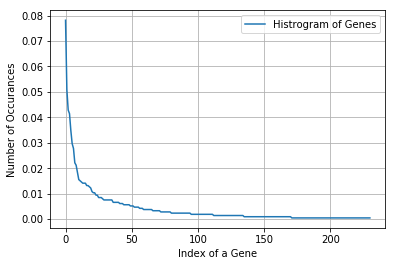

In [18]:
s = sum(unique_genes.values);
h = unique_genes.values/s;
plt.plot(h, label="Histrogram of Genes")
plt.xlabel('Index of a Gene')
plt.ylabel('Number of Occurances')
plt.legend()
plt.grid()
plt.show()


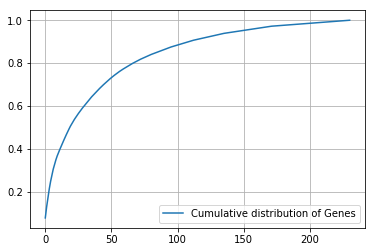

In [19]:
c = np.cumsum(h)
plt.plot(c,label='Cumulative distribution of Genes')
plt.grid()
plt.legend()
plt.show()

<p style="font-size:18px;"> <b>Q3.</b> How to featurize this Gene feature ?</p>

<p style="font-size:16px;"><b>Ans.</b>there are two ways we can featurize this variable
check out this video: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/
<ol><li>One hot Encoding</li><li>Response coding</li></ol></p>
<p> We will choose the appropriate featurization based on the ML model we use.  For this problem of multi-class classification with categorical features, one-hot encoding is better for Logistic regression while response coding is better for Random Forests. </p>

In [20]:
#response-coding of the Gene feature
# alpha is used for laplace smoothing
alpha = 1
# train gene feature
train_gene_feature_responseCoding = np.array(get_gv_feature(alpha, "Gene", train_df))
# test gene feature
test_gene_feature_responseCoding = np.array(get_gv_feature(alpha, "Gene", test_df))
# cross validation gene feature
cv_gene_feature_responseCoding = np.array(get_gv_feature(alpha, "Gene", cv_df))

In [21]:
print("train_gene_feature_responseCoding is converted feature using respone coding method. The shape of gene feature:", train_gene_feature_responseCoding.shape)

train_gene_feature_responseCoding is converted feature using respone coding method. The shape of gene feature: (2124, 9)


In [22]:
# one-hot encoding of Gene feature.
feature_names_tfidf=[]
gene_vectorizer = CountVectorizer()
train_gene_feature_onehotCoding = gene_vectorizer.fit_transform(train_df['Gene'])
test_gene_feature_onehotCoding = gene_vectorizer.transform(test_df['Gene'])
cv_gene_feature_onehotCoding = gene_vectorizer.transform(cv_df['Gene'])
feature_names_tfidf.extend(gene_vectorizer.get_feature_names())

print(len(gene_vectorizer.get_feature_names()))

231


In [23]:
train_df['Gene'].head()

403      TP53
1759     IDH1
405      TP53
786     ERBB4
2769     BRAF
Name: Gene, dtype: object

In [24]:
gene_vectorizer.get_feature_names()

['abl1',
 'acvr1',
 'ago2',
 'akt1',
 'akt2',
 'akt3',
 'alk',
 'apc',
 'ar',
 'araf',
 'arid1a',
 'arid1b',
 'arid2',
 'arid5b',
 'atm',
 'aurka',
 'aurkb',
 'axl',
 'b2m',
 'bap1',
 'bard1',
 'bcl10',
 'bcl2l11',
 'bcor',
 'braf',
 'brca1',
 'brca2',
 'brd4',
 'brip1',
 'btk',
 'card11',
 'carm1',
 'casp8',
 'cbl',
 'ccnd1',
 'ccnd3',
 'ccne1',
 'cdh1',
 'cdk12',
 'cdk4',
 'cdk6',
 'cdk8',
 'cdkn1a',
 'cdkn1b',
 'cdkn2a',
 'cdkn2b',
 'cebpa',
 'chek2',
 'cic',
 'crebbp',
 'ctcf',
 'ctla4',
 'ctnnb1',
 'ddr2',
 'dicer1',
 'dnmt3a',
 'dnmt3b',
 'dusp4',
 'egfr',
 'elf3',
 'ep300',
 'epas1',
 'epcam',
 'erbb2',
 'erbb3',
 'erbb4',
 'ercc2',
 'ercc4',
 'erg',
 'errfi1',
 'esr1',
 'etv1',
 'etv6',
 'ewsr1',
 'ezh2',
 'fam58a',
 'fanca',
 'fancc',
 'fat1',
 'fbxw7',
 'fgf3',
 'fgfr1',
 'fgfr2',
 'fgfr3',
 'fgfr4',
 'flt1',
 'flt3',
 'foxa1',
 'foxl2',
 'foxp1',
 'fubp1',
 'gata3',
 'gli1',
 'gnaq',
 'gnas',
 'h3f3a',
 'hist1h1c',
 'hla',
 'hnf1a',
 'hras',
 'idh1',
 'idh2',
 'igf1r',
 'ikb

In [25]:
print("train_gene_feature_onehotCoding is converted feature using one-hot encoding method. The shape of gene feature:", train_gene_feature_onehotCoding.shape)

train_gene_feature_onehotCoding is converted feature using one-hot encoding method. The shape of gene feature: (2124, 231)


<p style="font-size:18px;"> <b>Q4.</b> How good is this gene feature  in predicting y_i?</p>

There are many ways to estimate how good a feature is, in predicting y_i. One of the good methods is to build a proper ML model using just this feature. In this case, we will build a logistic regression model using only Gene feature (one hot encoded) to predict y_i.

For values of alpha =  1e-05 The log loss is: 1.3900950286127993
For values of alpha =  0.0001 The log loss is: 1.231438912208292
For values of alpha =  0.001 The log loss is: 1.2413637987665762
For values of alpha =  0.01 The log loss is: 1.3288331847671546
For values of alpha =  0.1 The log loss is: 1.4273220665542894
For values of alpha =  1 The log loss is: 1.4619646550432304


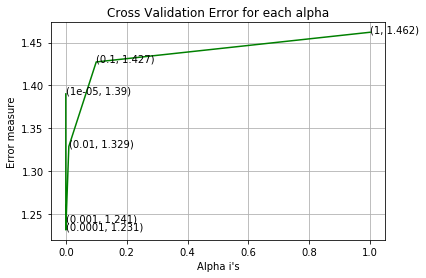

For values of best alpha =  0.0001 The train log loss is: 1.0376486162886116
For values of best alpha =  0.0001 The cross validation log loss is: 1.231438912208292
For values of best alpha =  0.0001 The test log loss is: 1.1808850275274652


In [26]:
alpha = [10 ** x for x in range(-5, 1)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


cv_log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_gene_feature_onehotCoding, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_gene_feature_onehotCoding, y_train)
    predict_y = sig_clf.predict_proba(cv_gene_feature_onehotCoding)
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_gene_feature_onehotCoding, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_gene_feature_onehotCoding, y_train)

predict_y = sig_clf.predict_proba(train_gene_feature_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_gene_feature_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_gene_feature_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


<p style="font-size:18px;"> <b>Q5.</b> Is the Gene feature stable across all the data sets (Test, Train, Cross validation)?</p>
<p style="font-size:16px;"> <b>Ans.</b> Yes, it is. Otherwise, the CV and Test errors would be significantly more than train error. </p>

In [27]:
print("Q6. How many data points in Test and CV datasets are covered by the ", unique_genes.shape[0], " genes in train dataset?")

test_coverage=test_df[test_df['Gene'].isin(list(set(train_df['Gene'])))].shape[0]
cv_coverage=cv_df[cv_df['Gene'].isin(list(set(train_df['Gene'])))].shape[0]

print('Ans\n1. In test data',test_coverage, 'out of',test_df.shape[0], ":",(test_coverage/test_df.shape[0])*100)
print('2. In cross validation data',cv_coverage, 'out of ',cv_df.shape[0],":" ,(cv_coverage/cv_df.shape[0])*100)

Q6. How many data points in Test and CV datasets are covered by the  231  genes in train dataset?
Ans
1. In test data 645 out of 665 : 96.99248120300751
2. In cross validation data 513 out of  532 : 96.42857142857143


<h3>3.2.2 Univariate Analysis on Variation Feature</h3>

<p style="font-size:18px;"> <b>Q7.</b> Variation, What type of feature is it ?</p>
<p style="font-size:16px;"><b>Ans.</b> Variation is a categorical variable </p>
<p style="font-size:18px;"> <b>Q8.</b> How many categories are there?</p>

In [28]:
unique_variations = train_df['Variation'].value_counts()
print('Number of Unique Variations :', unique_variations.shape[0])
# the top 10 variations that occured most
print(unique_variations.head(10))

Number of Unique Variations : 1921
Truncating_Mutations    60
Amplification           46
Deletion                44
Fusions                 27
Overexpression           4
Q61H                     3
G12V                     3
Q61R                     3
F384L                    2
P130S                    2
Name: Variation, dtype: int64


In [29]:
print("Ans: There are", unique_variations.shape[0] ,"different categories of variations in the train data, and they are distibuted as follows",)

Ans: There are 1921 different categories of variations in the train data, and they are distibuted as follows


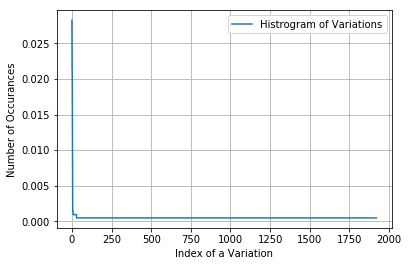

In [30]:
s = sum(unique_variations.values);
h = unique_variations.values/s;
plt.plot(h, label="Histrogram of Variations")
plt.xlabel('Index of a Variation')
plt.ylabel('Number of Occurances')
plt.legend()
plt.grid()
plt.show()

[0.02824859 0.04990584 0.07062147 ... 0.99905838 0.99952919 1.        ]


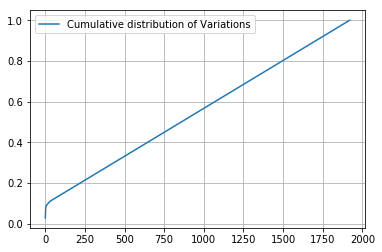

In [31]:
c = np.cumsum(h)
print(c)
plt.plot(c,label='Cumulative distribution of Variations')
plt.grid()
plt.legend()
plt.show()

<p style="font-size:18px;"> <b>Q9.</b> How to featurize this Variation feature ?</p>

<p style="font-size:16px;"><b>Ans.</b>There are two ways we can featurize this variable
check out this video: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/
<ol><li>One hot Encoding</li><li>Response coding</li></ol></p>
<p> We will be using both these methods to featurize the Variation Feature </p>

In [32]:
# alpha is used for laplace smoothing
alpha = 1
# train gene feature
train_variation_feature_responseCoding = np.array(get_gv_feature(alpha, "Variation", train_df))
# test gene feature
test_variation_feature_responseCoding = np.array(get_gv_feature(alpha, "Variation", test_df))
# cross validation gene feature
cv_variation_feature_responseCoding = np.array(get_gv_feature(alpha, "Variation", cv_df))

In [33]:
print("train_variation_feature_responseCoding is a converted feature using the response coding method. The shape of Variation feature:", train_variation_feature_responseCoding.shape)

train_variation_feature_responseCoding is a converted feature using the response coding method. The shape of Variation feature: (2124, 9)


In [34]:
# one-hot encoding of variation feature.
variation_vectorizer = CountVectorizer()
train_variation_feature_onehotCoding = variation_vectorizer.fit_transform(train_df['Variation'])
test_variation_feature_onehotCoding = variation_vectorizer.transform(test_df['Variation'])
cv_variation_feature_onehotCoding = variation_vectorizer.transform(cv_df['Variation'])

feature_names_tfidf.extend(variation_vectorizer.get_feature_names())
print(len(variation_vectorizer.get_feature_names()))

1952


In [35]:
print("train_variation_feature_onehotEncoded is converted feature using the onne-hot encoding method. The shape of Variation feature:", train_variation_feature_onehotCoding.shape)

train_variation_feature_onehotEncoded is converted feature using the onne-hot encoding method. The shape of Variation feature: (2124, 1952)


<p style="font-size:18px;"> <b>Q10.</b> How good is this Variation feature  in predicting y_i?</p>

Let's build a model just like the earlier!

For values of alpha =  1e-05 The log loss is: 1.7256529757643633
For values of alpha =  0.0001 The log loss is: 1.7148413335016208
For values of alpha =  0.001 The log loss is: 1.719076096107984
For values of alpha =  0.01 The log loss is: 1.7289748352226018
For values of alpha =  0.1 The log loss is: 1.7444758527409148
For values of alpha =  1 The log loss is: 1.745743451215074


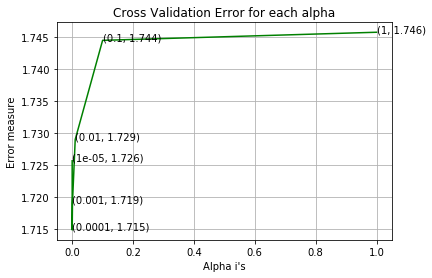

For values of best alpha =  0.0001 The train log loss is: 0.7775845786771378
For values of best alpha =  0.0001 The cross validation log loss is: 1.7148413335016208
For values of best alpha =  0.0001 The test log loss is: 1.7072681354620434


In [36]:
alpha = [10 ** x for x in range(-5, 1)]

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


cv_log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_variation_feature_onehotCoding, y_train)
    
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_variation_feature_onehotCoding, y_train)
    predict_y = sig_clf.predict_proba(cv_variation_feature_onehotCoding)
    
    cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_variation_feature_onehotCoding, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_variation_feature_onehotCoding, y_train)

predict_y = sig_clf.predict_proba(train_variation_feature_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_variation_feature_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_variation_feature_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


<p style="font-size:18px;"> <b>Q11.</b> Is the Variation feature stable across all the data sets (Test, Train, Cross validation)?</p>
<p style="font-size:16px;"> <b>Ans.</b> Not sure! But lets be very sure using the below analysis. </p>

In [37]:
print("Q12. How many data points are covered by total ", unique_variations.shape[0], " genes in test and cross validation data sets?")
test_coverage=test_df[test_df['Variation'].isin(list(set(train_df['Variation'])))].shape[0]
cv_coverage=cv_df[cv_df['Variation'].isin(list(set(train_df['Variation'])))].shape[0]
print('Ans\n1. In test data',test_coverage, 'out of',test_df.shape[0], ":",(test_coverage/test_df.shape[0])*100)
print('2. In cross validation data',cv_coverage, 'out of ',cv_df.shape[0],":" ,(cv_coverage/cv_df.shape[0])*100)

Q12. How many data points are covered by total  1921  genes in test and cross validation data sets?
Ans
1. In test data 70 out of 665 : 10.526315789473683
2. In cross validation data 50 out of  532 : 9.398496240601503


<h1>5. Assignments</h1>

<ol>
    <li> Apply All the models with tf-idf features (Replace CountVectorizer with tfidfVectorizer and run the same cells)</li>
    <li> Instead of using all the words in the dataset, use only the top 1000 words based of tf-idf values</li>
    <li>Apply Logistic regression with CountVectorizer Features, including both unigrams and bigrams</li>
    <li> Try any of the feature engineering techniques discussed in the course to reduce the CV and test log-loss to a value less than 1.0</li>
</ol>

##  Assignment part 1 : Use TFIDF with unigrams and bigrams and extract the top 1000 features

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest,chi2

vectorizer = TfidfVectorizer(min_df=10)

df_train=vectorizer.fit_transform(train_df['TEXT'])
df_test=vectorizer.transform(test_df['TEXT'])
df_cv=vectorizer.transform(cv_df['TEXT'])



kbest=SelectKBest(k=1000).fit(df_train,y_train)
X_train_text_tfidf=kbest.transform(X=df_train)
X_test_text_tfidf =kbest.transform(X=df_test)
X_cv_text_tfidf =kbest.transform(X=df_cv)


print(X_train_text_tfidf.shape)
print(X_test_text_tfidf.shape)
print(X_cv_text_tfidf.shape)

# Get columns to keep
cols = kbest.get_support(indices=True)


(2124, 1000)
(665, 1000)
(532, 1000)


In [39]:
top_text_feature=[]
for i in cols:
    top_text_feature.append(vectorizer.get_feature_names()[i])
    
feature_names_tfidf.extend(top_text_feature)

In [40]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_train_tfidf=hstack((train_gene_feature_onehotCoding,train_variation_feature_onehotCoding,X_train_text_tfidf)).tocsr()

X_test_tfidf=hstack((test_gene_feature_onehotCoding,test_variation_feature_onehotCoding,X_test_text_tfidf)).tocsr()

X_cv_tfidf=hstack((cv_gene_feature_onehotCoding,cv_variation_feature_onehotCoding,X_cv_text_tfidf)).tocsr()

print(X_train_tfidf.shape)
print(X_test_tfidf.shape)
print(X_cv_tfidf.shape)

(2124, 3183)
(665, 3183)
(532, 3183)


## Category Encoding the Result

In [41]:
import category_encoders as ce
vectorizer = ce.TargetEncoder()

vectorizer.fit(X_train_text_tfidf,y_train)
X_train_text_tfidf=vectorizer.transform(X_train_text_tfidf)
X_test_text_tfidf=vectorizer.transform(X_test_text_tfidf)
X_cv_text_tfidf=vectorizer.transform(X_cv_text_tfidf)

print(X_train_text_tfidf.shape)
print(X_test_text_tfidf.shape)
print(X_cv_text_tfidf.shape)



(2124, 1000)
(665, 1000)
(532, 1000)


## build the Data Frame for Response encoding

In [42]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_train_tfidf_re=hstack((train_gene_feature_responseCoding,train_variation_feature_responseCoding,X_train_text_tfidf)).tocsr()

X_test_tfidf_re=hstack((test_gene_feature_responseCoding,test_variation_feature_responseCoding,X_test_text_tfidf)).tocsr()

X_cv_tfidf_re=hstack((cv_gene_feature_responseCoding,cv_variation_feature_responseCoding,X_cv_text_tfidf)).tocsr()

print(X_train_tfidf_re.shape)
print(X_test_tfidf_re.shape)
print(X_cv_tfidf_re.shape)

(2124, 1018)
(665, 1018)
(532, 1018)


## BOW for the Text Feature 

In [43]:
bow_essay_vectorizer = CountVectorizer(min_df=10,ngram_range=(1,2))


bow_essay_vectorizer.fit(train_df['TEXT'])

# we use the fitted CountVectorizer to convert the text to vector
X_train_text_bow=bow_essay_vectorizer.transform(train_df['TEXT'].values)
X_test_text_bow=bow_essay_vectorizer.transform(test_df['TEXT'].values)
X_cv_text_bow=bow_essay_vectorizer.transform(cv_df['TEXT'].values)

## build the Data Frame for one hot encoding

In [44]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_train_bow_ohe=hstack((train_gene_feature_onehotCoding,train_variation_feature_onehotCoding,X_train_text_bow)).tocsr()

X_test_bow_ohe=hstack((test_gene_feature_onehotCoding,test_variation_feature_onehotCoding,X_test_text_bow)).tocsr()

X_cv_bow_ohe=hstack((cv_gene_feature_onehotCoding,cv_variation_feature_onehotCoding,X_cv_text_bow)).tocsr()

print(X_train_bow_ohe.shape)
print(X_test_bow_ohe.shape)
print(X_cv_bow_ohe.shape)


(2124, 229081)
(665, 229081)
(532, 229081)


## Applying models to the TFIDF DF  encoding

#### Naive bayes Model with Hyper Parameter tuning.

In [52]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss

summary=[]

log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}

alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    nb=MultinomialNB(alpha=i)
    
    # fitting the model on crossvalidation train
    nb.fit(X_train_tfidf, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(nb, method="sigmoid")
    calibrated.fit(X_train_tfidf, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:01<00:00, 10.73it/s]


{1e-05: 1.2633213334965174, 0.0001: 1.2636922379402942, 0.001: 1.2627776749492243, 0.01: 1.2547589901583929, 0.1: 1.226606322831457, 0.2: 1.221141176406295, 0.3: 1.2200600153750847, 0.4: 1.2197742047601854, 0.5: 1.2200242084817108, 0.6: 1.2204927339824834, 0.7: 1.2210496093511587, 0.8: 1.22165573247661, 0.9: 1.2223928640389148, 1: 1.2231540666399356, 10: 1.2742391605915397, 100: 1.3256046385316327, 1000: 1.334127536708601}
{1e-05: 0.5376636519213512, 0.0001: 0.5414779472031334, 0.001: 0.5471368946150682, 0.01: 0.5483943441487248, 0.1: 0.6070395848022166, 0.2: 0.661789225839845, 0.3: 0.7028540386024081, 0.4: 0.7357895470682619, 0.5: 0.7628480563849478, 0.6: 0.785772153473277, 0.7: 0.8056585953280211, 0.8: 0.8231882660804223, 0.9: 0.839167774888932, 1: 0.8532469147666842, 10: 1.1214394444722673, 100: 1.2272346496240756, 1000: 1.2421111103741962}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

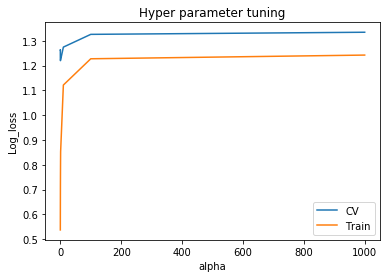

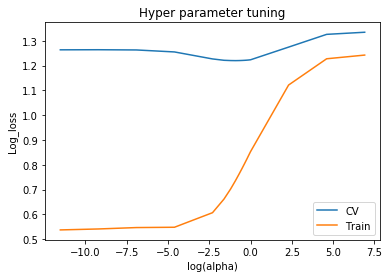

In [53]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


###  Find best alpha

In [54]:
#https://stackoverflow.com/questions/268272/getting-key-with-maximum-value-in-dictionary
def find_highest_alpha(k_dict):
    k=min(k_dict, key=k_dict.get)
    return k 

In [55]:
print(find_highest_alpha(log_loss_cv_tfidf_dict))

0.4


In [56]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
nb = MultinomialNB(alpha=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
nb.fit(X_train_tfidf, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=nb,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf)
pred_tfidf_train = calibrated.predict(X_train_tfidf)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = knn.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))


the log loss for test :1.2219867347993427
the log loss for train :0.4317443668191243
the log loss for cv :1.4028764585399225


-------------------- Confusion matrix --------------------


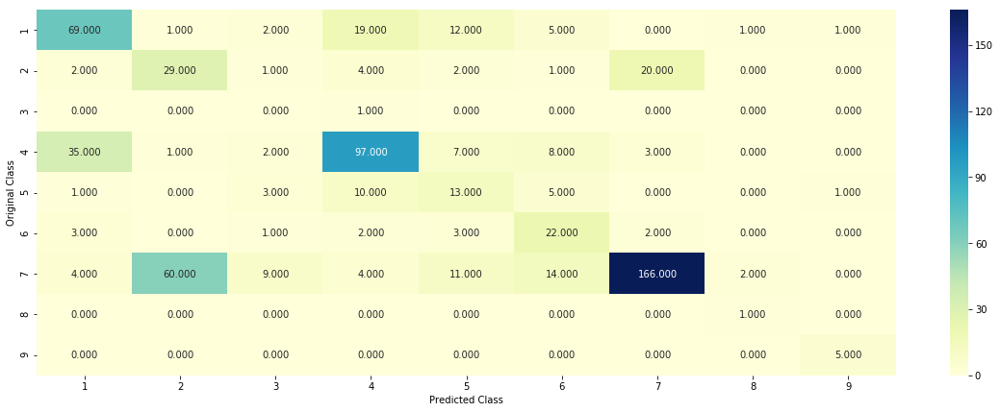

-------------------- Precision matrix (Columm Sum=1) --------------------


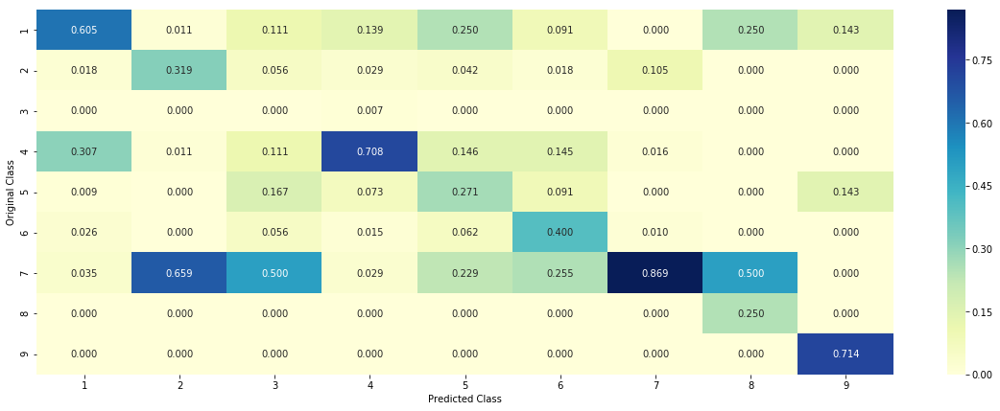

-------------------- Recall matrix (Row sum=1) --------------------


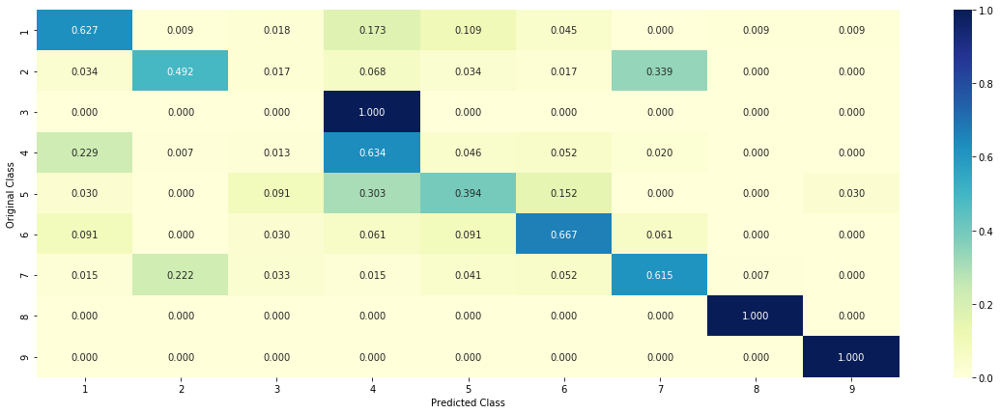

In [57]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [58]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['Navie Bayes','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])

% of missclassified point : 0.3954887218045113


In [59]:
print(len(feature_names_tfidf))
print(X_test_tfidf.shape)

3183
(665, 3183)


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [60]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])

Predicted Class : 5
Predicted Class Probabilities: [[0.0055 0.0042 0.0045 0.0117 0.9414 0.028  0.     0.003  0.0017]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1249.79it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [61]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])

Predicted Class : 5
Predicted Class Probabilities: [[3.023e-01 6.400e-03 6.800e-03 5.670e-02 5.111e-01 1.094e-01 1.000e-04
  4.600e-03 2.600e-03]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.02it/s]


<h2>4.2. K Nearest Neighbour Classification</h2>

In [62]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


for i in tqdm(range(1,50,4)):
    # create instance of model
    knn=KNeighborsClassifier (n_neighbors=i)
    
    # fitting the model on crossvalidation train
    knn.fit(X_train_tfidf, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(knn, method="sigmoid")
    calibrated.fit(X_train_tfidf, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:20<00:00,  1.61s/it]


{1: 1.226731035400456, 5: 1.152987928119482, 9: 1.1883054213817776, 13: 1.200520542941795, 17: 1.213480356806862, 21: 1.2268361679773603, 25: 1.2345644430209184, 29: 1.234167639917261, 33: 1.2307108486378138, 37: 1.226510318590019, 41: 1.2321968303280297, 45: 1.237040099141279, 49: 1.2389478070320372}
{1: 0.6435851191196417, 5: 0.8752918648346569, 9: 0.9765331699777596, 13: 1.0363060704633635, 17: 1.0746253859857857, 21: 1.1000427870104794, 25: 1.11982090244675, 29: 1.1320004755180053, 33: 1.1407855406318568, 37: 1.1496865922856883, 41: 1.1643959161095876, 45: 1.1780895131323568, 49: 1.188699151951515}


### Plot ROC_AUC_score VS different n_neighbors values (Train and CV set)

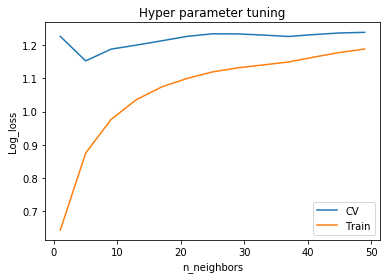

In [63]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('n_neighbors')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


###  Find best n_neighbors

In [64]:
print(find_highest_alpha(log_loss_cv_tfidf_dict))

5


In [65]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best n_neighbors
knn = KNeighborsClassifier(n_neighbors=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
knn.fit(X_train_tfidf, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=knn,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf)
pred_tfidf_train = calibrated.predict(X_train_tfidf)

#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = knn.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))


the log loss for test :1.107954300123613
the log loss for train :0.6550458741562593
the log loss for cv :1.2011588304439524


-------------------- Confusion matrix --------------------


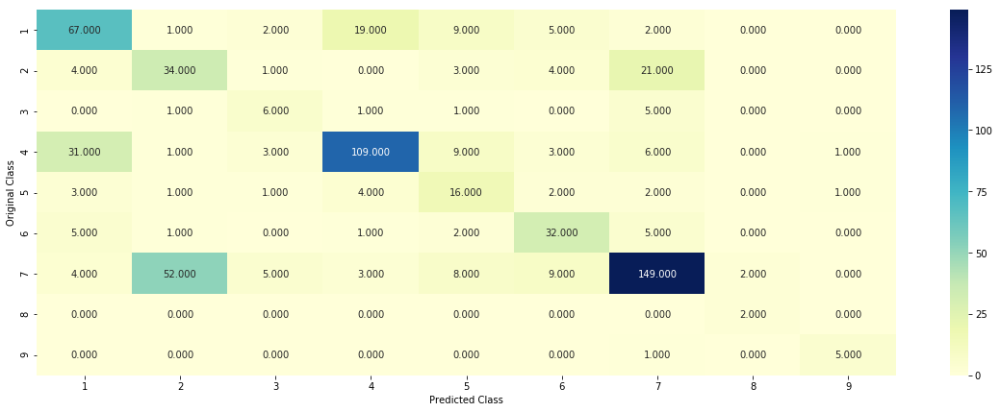

-------------------- Precision matrix (Columm Sum=1) --------------------


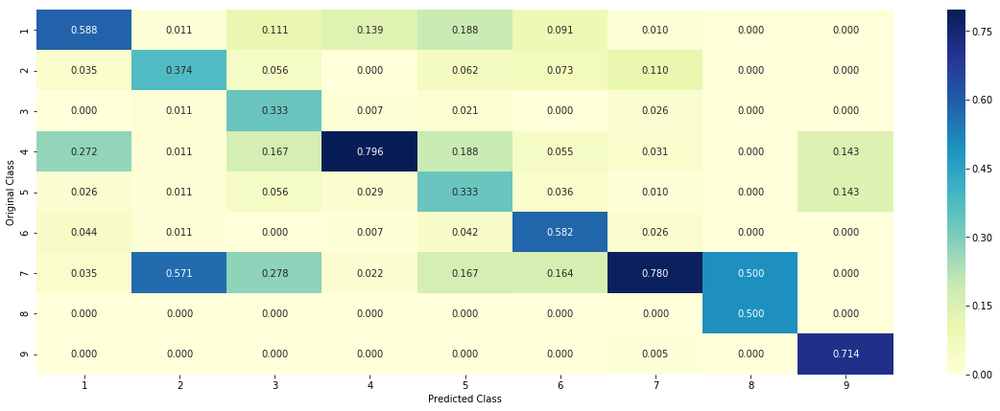

-------------------- Recall matrix (Row sum=1) --------------------


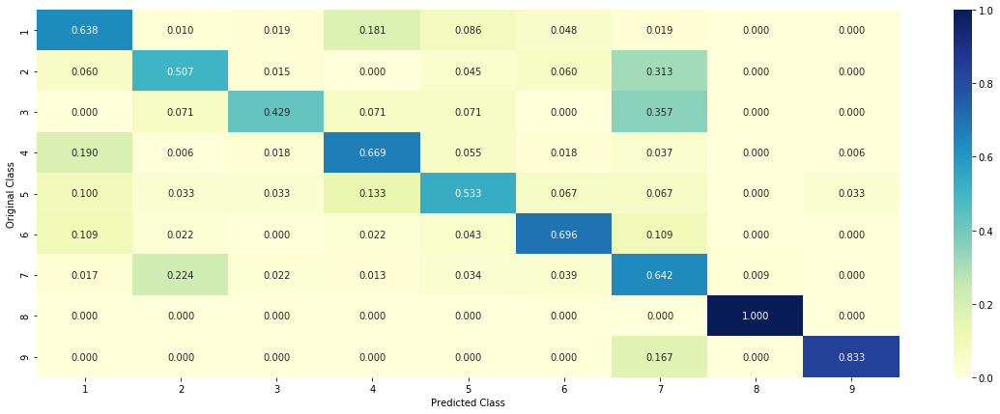

In [66]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [67]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['K-NN Classifer','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.3684210526315789


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [68]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[0.1123 0.0283 0.0099 0.1188 0.5986 0.1046 0.0234 0.001  0.0032]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1249.98it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [69]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.730e-02 1.810e-02 6.300e-03 1.660e-02 9.134e-01 1.060e-02 1.500e-02
  6.000e-04 2.000e-03]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.09it/s]


<h2>4.3. Logistic Regression with class balancing</h2>

In [70]:
from sklearn.linear_model  import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    lr=LogisticRegression(penalty='l2',class_weight='balanced',C=i)
    
    # fitting the model on crossvalidation train
    lr.fit(X_train_tfidf, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(lr, method="sigmoid")
    calibrated.fit(X_train_tfidf, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:10<00:00,  1.05s/it]


{1e-05: 1.4876363598084832, 0.0001: 1.4779722718330333, 0.001: 1.4083588170899133, 0.01: 1.2962942576020708, 0.1: 1.219518756458498, 0.2: 1.189047354757145, 0.3: 1.169615638219407, 0.4: 1.1561953273441476, 0.5: 1.1463747763320447, 0.6: 1.138855871147084, 0.7: 1.1329219980739813, 0.8: 1.128117494836059, 0.9: 1.12414609183849, 1: 1.1208131561952608, 10: 1.0917896599945294, 100: 1.1061304659451128, 1000: 1.128232239241464}
{1e-05: 1.4300026763498799, 0.0001: 1.4167079655147865, 0.001: 1.3216301194381013, 0.01: 1.1660710641985041, 0.1: 1.0490535816233528, 0.2: 0.9776491762764323, 0.3: 0.9246462811326241, 0.4: 0.8830709793210778, 0.5: 0.849133014798331, 0.6: 0.8205888230506587, 0.7: 0.7960971759402671, 0.8: 0.7747425143587124, 0.9: 0.7558907555133355, 1: 0.739086723107151, 10: 0.48258543967834994, 100: 0.43058729224494585, 1000: 0.4308109067979273}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

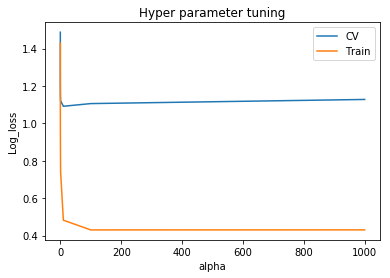

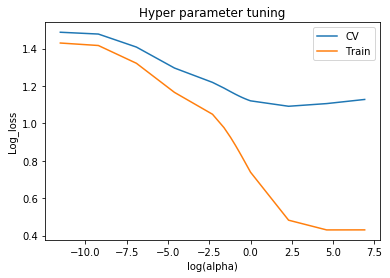

In [71]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [72]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


10


In [73]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
lr = LogisticRegression(penalty='l2',class_weight='balanced',C=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
lr.fit(X_train_tfidf, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=lr,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf)
pred_tfidf_train = calibrated.predict(X_train_tfidf)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = lr.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.636925456519765
the log loss for train :0.03607480471624782
the log loss for cv :1.9517282836827916


-------------------- Confusion matrix --------------------


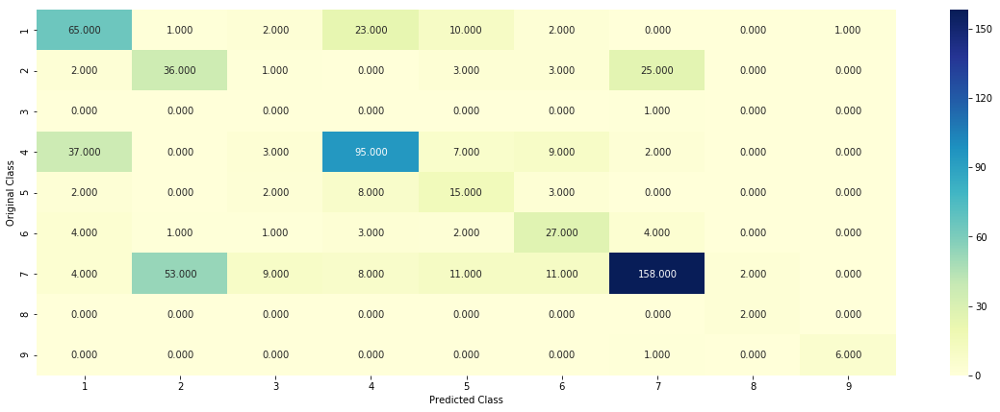

-------------------- Precision matrix (Columm Sum=1) --------------------


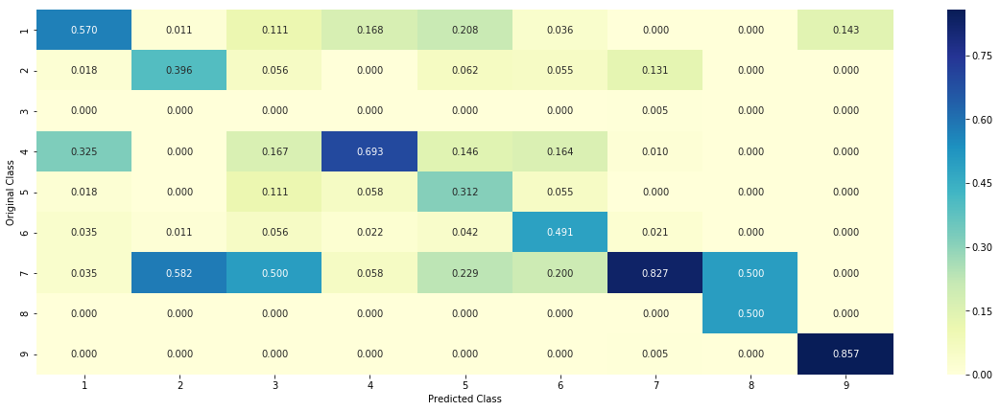

-------------------- Recall matrix (Row sum=1) --------------------


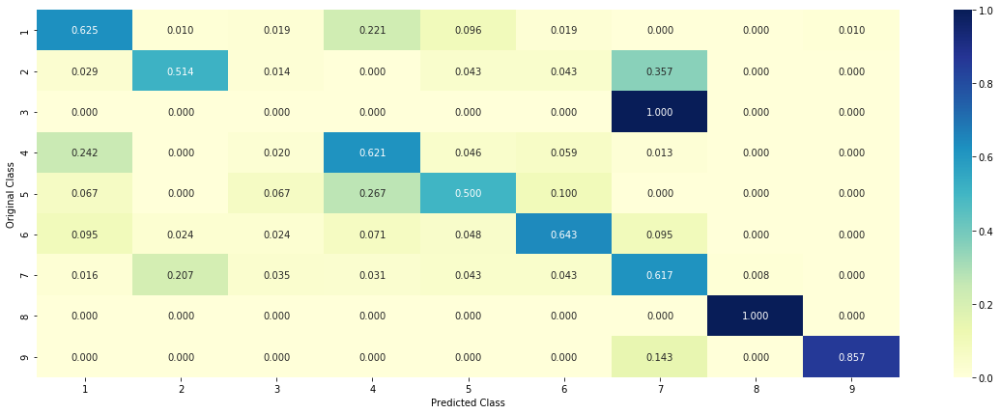

In [74]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [75]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['LR- Class Balancing','TFIDF',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.3924812030075188


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [76]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.621e-01 0.000e+00 7.000e-04 3.900e-03 8.308e-01 2.300e-03 0.000e+00
  1.000e-04 1.000e-04]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.09it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [77]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.000e-04 0.000e+00 4.400e-03 6.400e-03 9.882e-01 8.000e-04 0.000e+00
  1.000e-04 1.000e-04]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.05it/s]


<h2>4.3. Logistic Regression without class balancing</h2>

In [78]:
from sklearn.linear_model  import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    lr=LogisticRegression(penalty='l2',C=i)
    
    # fitting the model on crossvalidation train
    lr.fit(X_train_tfidf, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(lr, method="sigmoid")
    calibrated.fit(X_train_tfidf, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:10<00:00,  1.03s/it]


{1e-05: 1.4561148056489281, 0.0001: 1.447681880385453, 0.001: 1.3826607420101498, 0.01: 1.284672423945269, 0.1: 1.2130284234078232, 0.2: 1.1770879105532321, 0.3: 1.1569714671160547, 0.4: 1.143813598495583, 0.5: 1.1344840235241314, 0.6: 1.127525964914372, 0.7: 1.1221478927944446, 0.8: 1.1178815800128654, 0.9: 1.114420657110857, 1: 1.1115763400543945, 10: 1.0921782067933672, 100: 1.1084812708946932, 1000: 1.1305171733760615}
{1e-05: 1.4005033374262426, 0.0001: 1.3904282131979118, 0.001: 1.3111295689153877, 0.01: 1.1871342303241255, 0.1: 1.0425193546140648, 0.2: 0.9672519040597751, 0.3: 0.914206694385149, 0.4: 0.8726819362840602, 0.5: 0.8385158620605281, 0.6: 0.8095322659353948, 0.7: 0.7844525602191036, 0.8: 0.7624420811249049, 0.9: 0.7429174960795502, 1: 0.7254561984368079, 10: 0.47536845592193666, 100: 0.431551161000939, 1000: 0.43261892277635633}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

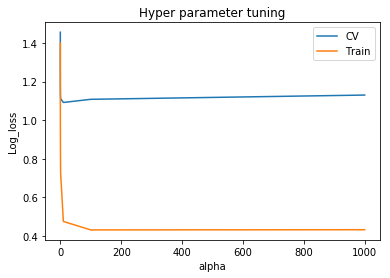

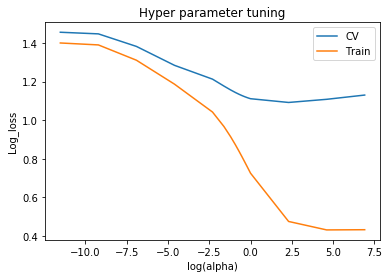

In [79]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [80]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


10


In [81]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
lr = LogisticRegression(penalty='l2',C=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
lr.fit(X_train_tfidf, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=lr,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf)
pred_tfidf_train = calibrated.predict(X_train_tfidf)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = lr.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.6526129875239222
the log loss for train :0.027012190901983375
the log loss for cv :1.9638687613349126


-------------------- Confusion matrix --------------------


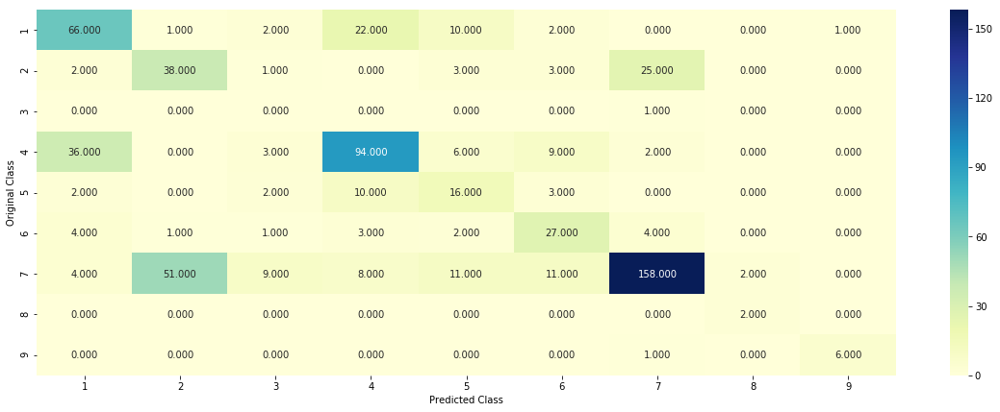

-------------------- Precision matrix (Columm Sum=1) --------------------


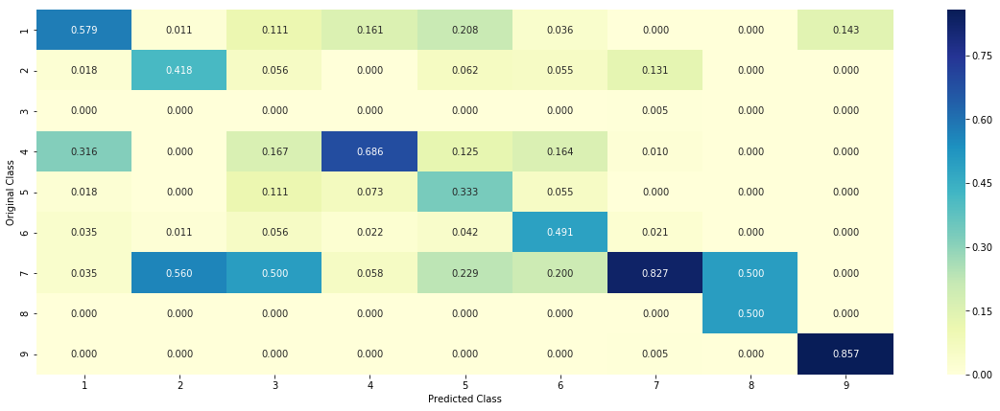

-------------------- Recall matrix (Row sum=1) --------------------


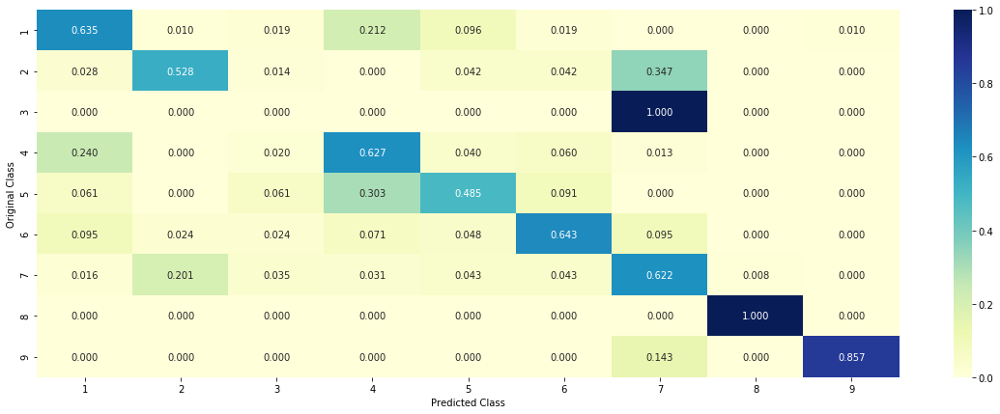

In [82]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [83]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['LR- NO Class Balancing','TFIDF',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.3879699248120301


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [84]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.272e-01 0.000e+00 5.000e-04 2.200e-03 8.677e-01 2.300e-03 0.000e+00
  1.000e-04 1.000e-04]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1249.98it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [85]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.00e-04 0.00e+00 4.00e-03 4.00e-03 9.91e-01 8.00e-04 0.00e+00 1.00e-04
  1.00e-04]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.13it/s]


<h2>4.4. Linear Support Vector Machines</h2>

In [86]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(alpha):
    # create instance of model
    svm=SGDClassifier(loss='hinge',penalty='l1', alpha=i)
    
    # fitting the model on crossvalidation train
    svm.fit(X_train_tfidf, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(svm, method="sigmoid")
    calibrated.fit(X_train_tfidf, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.63it/s]


{1e-05: 1.3209893633172802, 0.0001: 1.2796270268188907, 0.001: 1.3626522534055026, 0.01: 1.6492541763645363, 0.1: 1.8302599811768565, 1: 1.8302599806266215, 10: 1.8302599806221103, 100: 1.8302599806220161, 1000: 1.8302599806220095, 10000: 1.830259980622008}
{1e-05: 0.6897174493276563, 0.0001: 0.7066861489776505, 0.001: 1.2438628133363778, 0.01: 1.6546697851192471, 0.1: 1.8317745293809085, 1: 1.8317745288855598, 10: 1.8317745288815954, 100: 1.8317745288815135, 1000: 1.8317745288815075, 10000: 1.8317745288815064}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

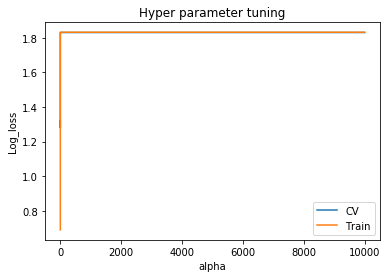

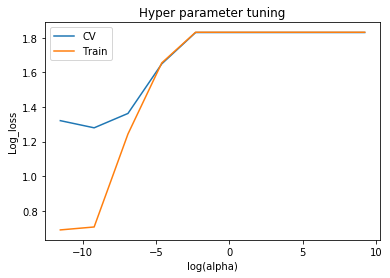

In [87]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [88]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


0.0001


In [89]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
svm = SGDClassifier(loss='hinge',penalty='l1',alpha=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
svm.fit(X_train_tfidf, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=svm,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf)
pred_tfidf_train = calibrated.predict(X_train_tfidf)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = svm.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))


the log loss for test :2.0185262359557297
the log loss for train :0.053771152282133375
the log loss for cv :2.195640310043817


-------------------- Confusion matrix --------------------


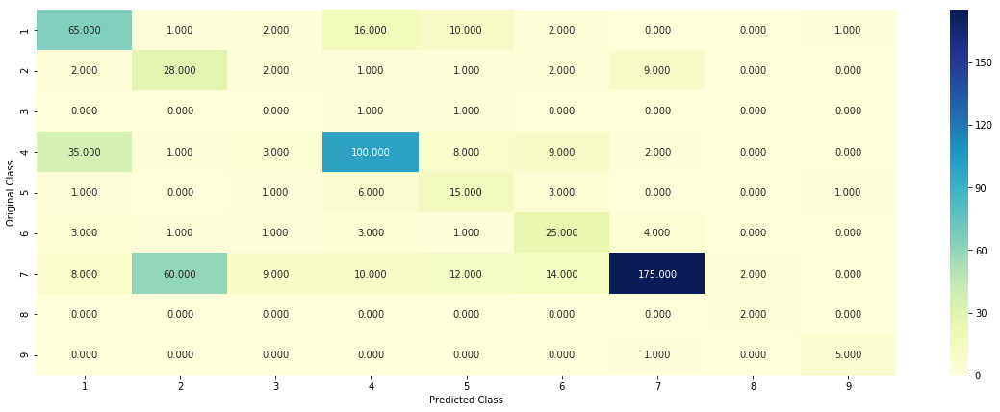

-------------------- Precision matrix (Columm Sum=1) --------------------


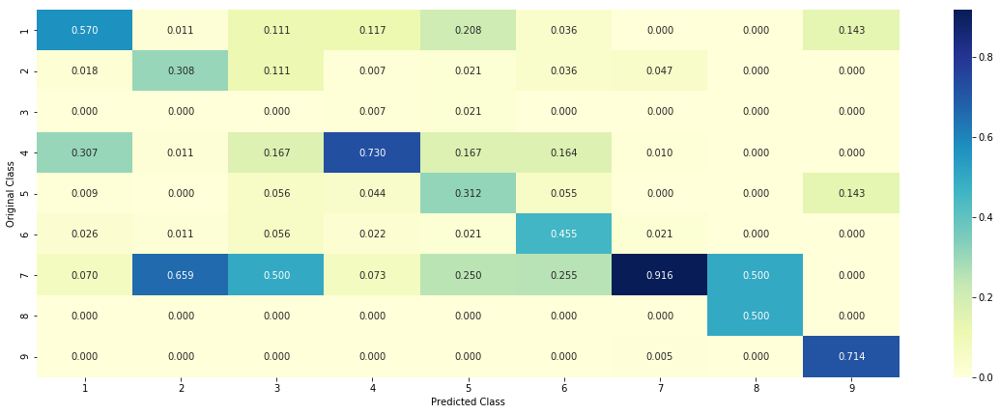

-------------------- Recall matrix (Row sum=1) --------------------


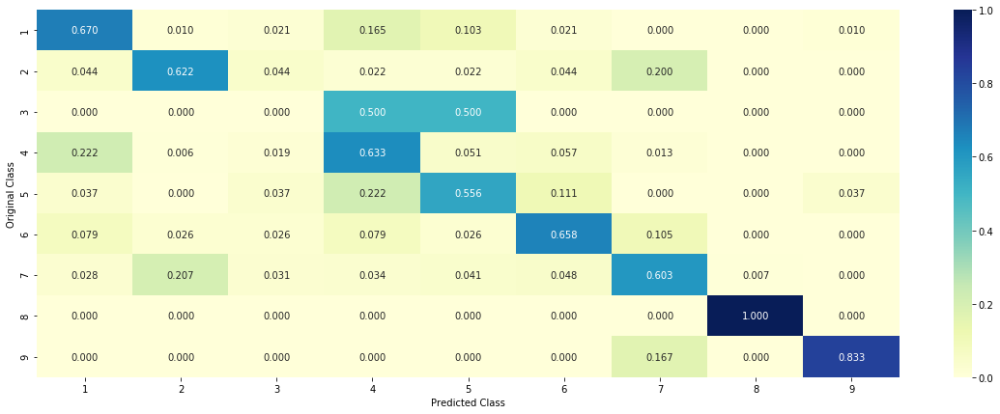

In [90]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [91]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['SVM','TFIDF',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.37593984962406013


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [92]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])



Predicted Class : 5
Predicted Class Probabilities: [[0.2456 0.1843 0.     0.0171 0.497  0.0017 0.     0.0066 0.0476]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1249.98it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [93]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[0.00e+00 6.00e-04 1.10e-03 1.90e-03 9.94e-01 1.00e-04 1.00e-04 2.00e-04
  1.90e-03]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.05it/s]


<h2>4.5 Random Forest Classifier</h2>

In [94]:
log_loss_cv_tfidf_dict=[]
log_loss_train_tfidf_dict=[]
           

for n in tqdm(range(1,5,1)):
    for d in range(10,50,10):
        #create instance of model
        rf=RandomForestClassifier(max_depth=d,n_estimators=n,n_jobs=-1,random_state=0)
        
        #Fit the model on the training set 
        rf.fit(X_train_tfidf,y_train)
        
        # fit the model to the calibrator
        calibrated = CalibratedClassifierCV(rf, method="sigmoid")
        calibrated.fit(X_train_tfidf, y_train)
        
        
        # predict the response on the crossvalidation train
        pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf)
    
        #evaluate CV log loss
        log_loss_cv=log_loss(y_cv,pred_tfidf_cv)


        #insert into dict
        log_loss_cv_tfidf_dict.append([n,d,log_loss_cv])


        # predict the response on the train
        pred_tfidf_train = calibrated.predict_proba(X_train_tfidf)

        #evaluate train roc_auc
        log_loss_train  =log_loss(y_train,pred_tfidf_train)

        #insert into dict
        log_loss_train_tfidf_dict.append([n,d,log_loss_train])

print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:21<00:00,  5.06s/it]


[[1, 10, 1.5106580387583168], [1, 20, 1.4653384878938067], [1, 30, 1.4946238647068606], [1, 40, 1.4569194240222982], [2, 10, 1.3808022219392915], [2, 20, 1.372293107277612], [2, 30, 1.3815734305137852], [2, 40, 1.3419898521599758], [3, 10, 1.327334442820919], [3, 20, 1.3143150152378726], [3, 30, 1.3281704622745436], [3, 40, 1.297720961005255], [4, 10, 1.3003818516591221], [4, 20, 1.2795150925762862], [4, 30, 1.287377435758053], [4, 40, 1.2691523949417538]]
[[1, 10, 1.3687610405125856], [1, 20, 1.1254923778543435], [1, 30, 1.1011101944882897], [1, 40, 1.1023404822287377], [2, 10, 1.157795747909781], [2, 20, 0.9137456899319857], [2, 30, 0.8909940743893371], [2, 40, 0.8903077713978963], [3, 10, 1.0364048746144439], [3, 20, 0.7889336232774491], [3, 30, 0.7672209983321472], [3, 40, 0.7657674723344755], [4, 10, 0.9948183375259191], [4, 20, 0.715104828994843], [4, 30, 0.699530882464464], [4, 40, 0.7000013073226213]]


In [95]:
from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

x1=[]
y1=[]
z1=[]

x2=[]
y2=[]
z2=[]

for value in log_loss_cv_tfidf_dict:
    x1.append(value[0])
    y1.append(value[1])
    z1.append(value[2])
    
for value in log_loss_train_tfidf_dict:
    x2.append(value[0])
    y2.append(value[1])
    z2.append(value[2])
    
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'Cross val')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'train')
data = [trace1, trace2]

layout = go.Layout(title='Depth vs split size vs AUC(TFIDF)',scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')


In [96]:
from numpy import array

def find_optimal(input_list):
    optimal={}
    temp=pd.DataFrame(input_list)
    optimal_esti=int(temp[temp[2]==min(temp[2])].iloc[0][0])
    optimal_depth=int(temp[temp[2]==min(temp[2])].iloc[0][1])
    

    optimal['n_estimators']=optimal_esti
    optimal['max_depth']=optimal_depth

    return optimal

In [97]:
find_optimal(log_loss_cv_tfidf_dict)

{'n_estimators': 4, 'max_depth': 40}

In [98]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
rf = RandomForestClassifier(max_depth=find_optimal(log_loss_cv_tfidf_dict)['max_depth'],n_estimators=find_optimal(log_loss_cv_tfidf_dict)['n_estimators'],n_jobs=-1,random_state=0)

# fitting the model on crossvalidation train
rf.fit(X_train_tfidf, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=rf,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf)
pred_tfidf_train = calibrated.predict(X_train_tfidf)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = rf.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.627314698554781
the log loss for train :0.2025866926188763
the log loss for cv :1.7436864372606946


-------------------- Confusion matrix --------------------


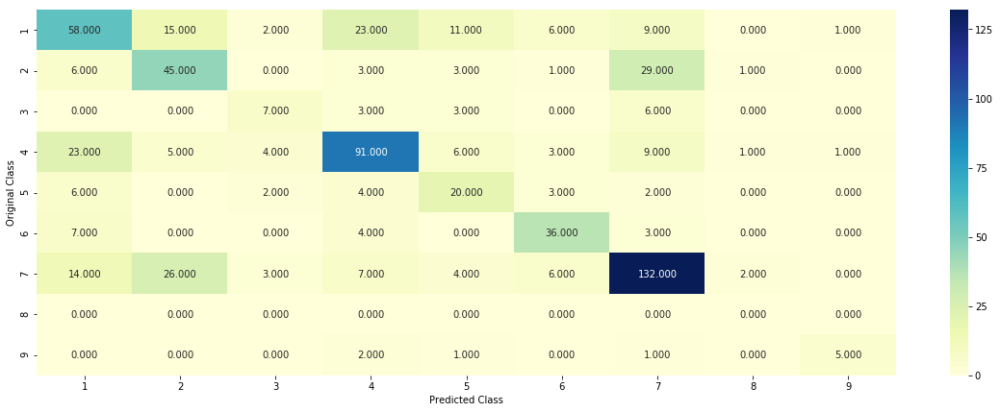

-------------------- Precision matrix (Columm Sum=1) --------------------


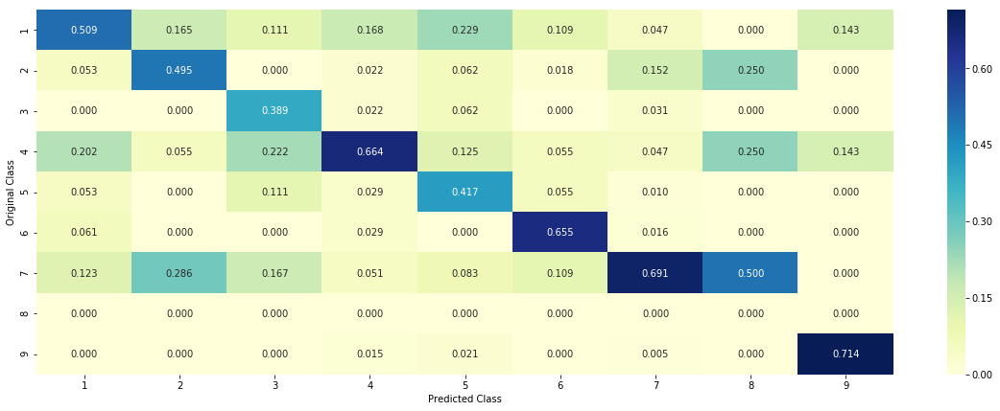

-------------------- Recall matrix (Row sum=1) --------------------


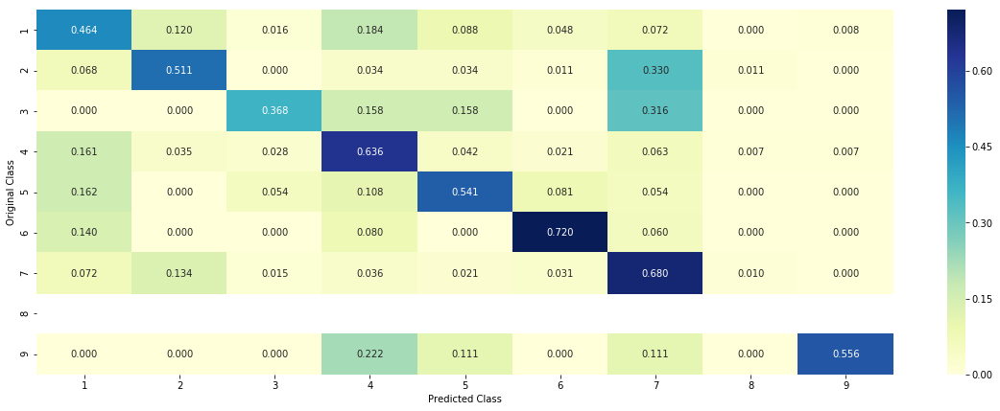

In [99]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [100]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['Random Forest','TFIDF',find_optimal(log_loss_cv_tfidf_dict)['max_depth'],find_optimal(log_loss_cv_tfidf_dict)['n_estimators'],log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.4075187969924812


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [101]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[2.500e-03 2.600e-03 1.300e-03 3.300e-03 9.842e-01 2.100e-03 2.600e-03
  5.000e-04 1.000e-03]]
Actual Class : 5
[[  25 2487 3159   26 3163 2495 2493 2859   24 2581]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

brca1
brca1
variants
brca2
vus
brct
brca2
neutral
braf
deleterious


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1249.83it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [102]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 1
Predicted Class Probabilities: [[5.283e-01 2.000e-03 1.100e-03 2.600e-03 4.611e-01 1.700e-03 2.100e-03
  4.000e-04 8.000e-04]]
Actual Class : 5
[[1942  222   25  547 2487 3159 2522 2495   26  225]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

truncating_mutations
tp53
brca1
deletion
brca1
variants
cells
brct
brca2
tsc2


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.31it/s]


### Apllying all the ML model to the TFIDF_response Encoding

#### Naive bayes Model with Hyper Parameter tuning.

In [103]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    nb=MultinomialNB(alpha=i)
    
    # fitting the model on crossvalidation train
    nb.fit(X_train_tfidf_re, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(nb, method="sigmoid")
    calibrated.fit(X_train_tfidf_re, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf_re)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf_re)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:01<00:00,  8.54it/s]


{1e-05: 1.4012846906939327, 0.0001: 1.4022172501845498, 0.001: 1.4040493821212678, 0.01: 1.407186793551546, 0.1: 1.4153228147725316, 0.2: 1.4259683863741708, 0.3: 1.434340823434553, 0.4: 1.439496688314204, 0.5: 1.4430449445058935, 0.6: 1.4460855796514358, 0.7: 1.4485406067460884, 0.8: 1.4506305751199398, 0.9: 1.4524807466331686, 1: 1.4541462310222353, 10: 1.438447463672926, 100: 1.3608243676171932, 1000: 1.3397155917915995}
{1e-05: 1.2867549340016808, 0.0001: 1.2903739388183146, 0.001: 1.2951657135388857, 0.01: 1.3032790619096097, 0.1: 1.329644362847623, 0.2: 1.3480705731803375, 0.3: 1.361127109242806, 0.4: 1.369086200057111, 0.5: 1.3737129244271828, 0.6: 1.3772773674180514, 0.7: 1.3799687558810494, 0.8: 1.3821491547770723, 0.9: 1.383998453599328, 1: 1.3856531300426393, 10: 1.3812864277599632, 100: 1.3136666739759262, 1000: 1.295198086234738}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

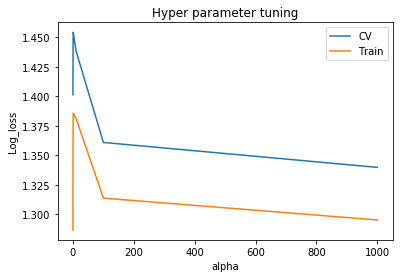

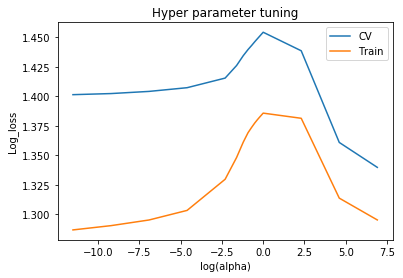

In [104]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


###  Find best alpha

In [105]:
#https://stackoverflow.com/questions/268272/getting-key-with-maximum-value-in-dictionary
def find_highest_alpha(k_dict):
    k=min(k_dict, key=k_dict.get)
    return k 

In [106]:
print(find_highest_alpha(log_loss_cv_tfidf_dict))

1000


In [107]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
nb = MultinomialNB(alpha=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
nb.fit(X_train_tfidf_re, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=nb,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf_re,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf_re)
pred_tfidf_train = calibrated.predict(X_train_tfidf_re)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = knn.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf_re)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf_re)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf_re)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))


the log loss for test :1.3351455750810195
the log loss for train :1.2911097083534957
the log loss for cv :1.3376754294813014


-------------------- Confusion matrix --------------------


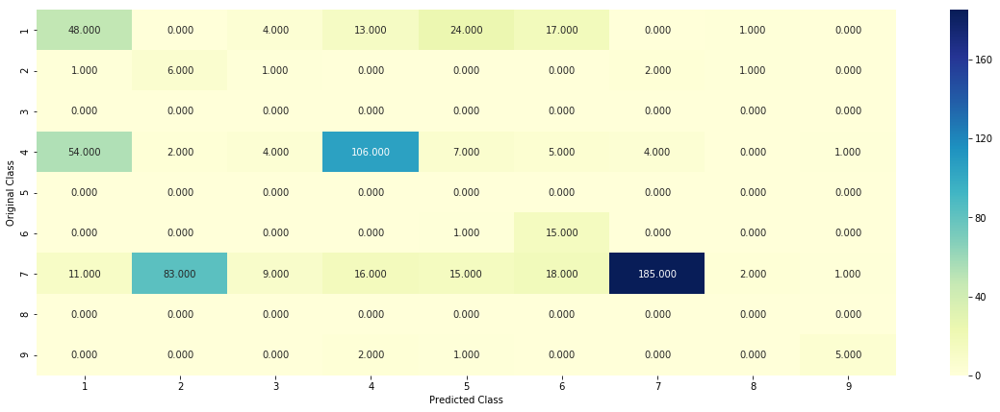

-------------------- Precision matrix (Columm Sum=1) --------------------


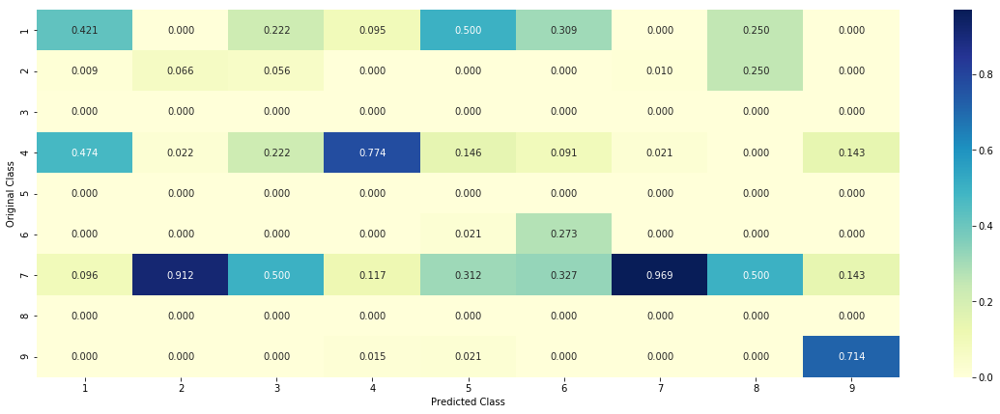

-------------------- Recall matrix (Row sum=1) --------------------


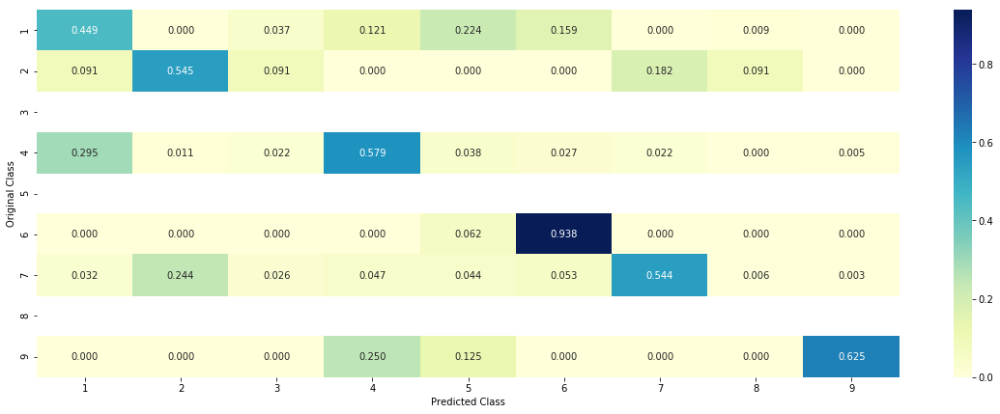

In [108]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [109]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['Navie Bayes','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])

% of missclassified point : 0.45112781954887216


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [110]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")

Predicted Class : 1
Predicted Class Probabilities: [[0.2743 0.     0.0158 0.2647 0.2428 0.2007 0.0017 0.     0.    ]]
Actual Class : 5
[[ 9  0  3  5  4 12 14 10 16 15]]
--------------------------------------------------
The top 10 features are:
Variation is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [111]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")

Predicted Class : 1
Predicted Class Probabilities: [[0.3748 0.     0.021  0.3026 0.154  0.1456 0.002  0.     0.    ]]
Actual Class : 5
[[ 9  0  3  5  4 12 14 10 16 15]]
--------------------------------------------------
The top 10 features are:
Variation is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature


<h2>4.2. K Nearest Neighbour Classification</h2>

In [112]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


for i in tqdm(range(1,50,4)):
    # create instance of model
    knn=KNeighborsClassifier (n_neighbors=i)
    
    # fitting the model on crossvalidation train
    knn.fit(X_train_tfidf_re, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(knn, method="sigmoid")
    calibrated.fit(X_train_tfidf_re, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf_re)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf_re)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:23<00:00,  1.85s/it]


{1: 1.2062127232164894, 5: 1.1491313361619093, 9: 1.1452844240525943, 13: 1.1565978651405973, 17: 1.1649569066273708, 21: 1.1649153530839969, 25: 1.1681789560465443, 29: 1.158875946352108, 33: 1.150895510395727, 37: 1.1524365659075642, 41: 1.1499384534353885, 45: 1.1534059464654898, 49: 1.1581356250234778}
{1: 0.4816212617137802, 5: 0.7675031676641552, 9: 0.8685333075833782, 13: 0.9170980645882234, 17: 0.9370275911576236, 21: 0.9571814003290544, 25: 0.971387261132195, 29: 0.983106139782183, 33: 0.9917341266117478, 37: 0.9987986387245011, 41: 1.0059681680373438, 45: 1.0115810219053538, 49: 1.0158185879363733}


### Plot ROC_AUC_score VS different n_neighbors values (Train and CV set)

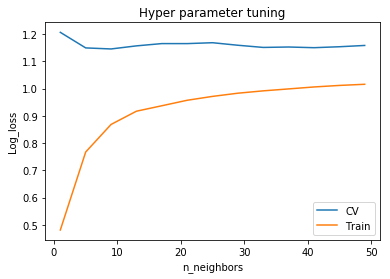

In [113]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('n_neighbors')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


###  Find best n_neighbors

In [114]:
print(find_highest_alpha(log_loss_cv_tfidf_dict))

9


In [115]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best n_neighbors
knn = KNeighborsClassifier(n_neighbors=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
knn.fit(X_train_tfidf_re, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=knn,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf_re,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf_re)
pred_tfidf_train = calibrated.predict(X_train_tfidf_re)

#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = knn.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf_re)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf_re)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf_re)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))


the log loss for test :1.0483753560402256
the log loss for train :0.7327998594358673
the log loss for cv :1.1847663562810133


-------------------- Confusion matrix --------------------


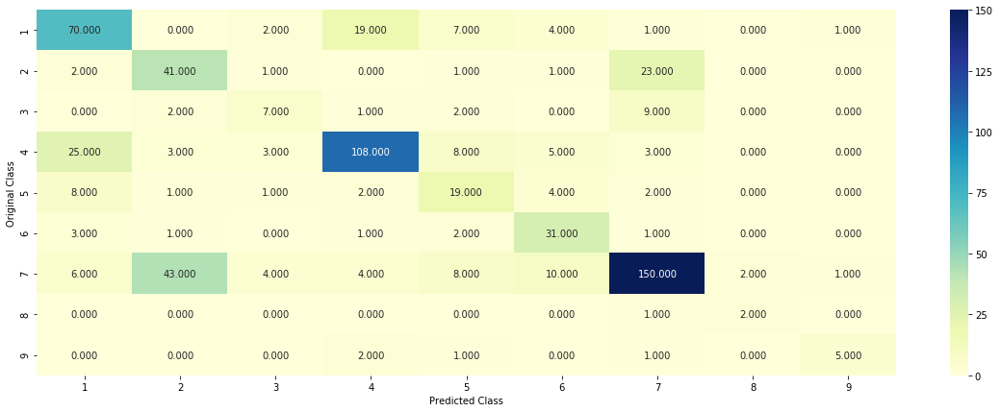

-------------------- Precision matrix (Columm Sum=1) --------------------


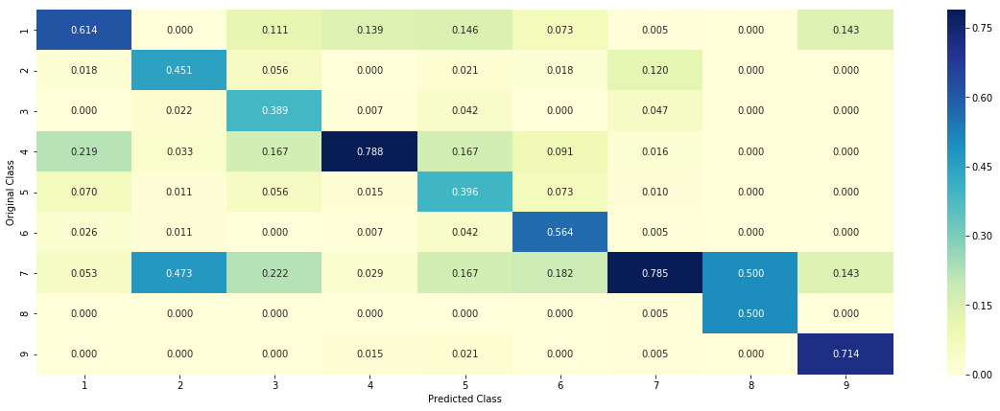

-------------------- Recall matrix (Row sum=1) --------------------


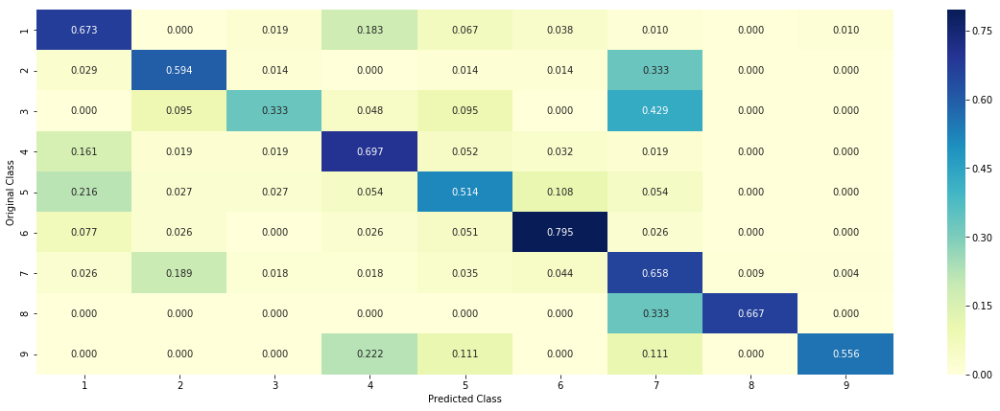

In [116]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [117]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['K-NN Classifer','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.34887218045112783


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [118]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 1
Predicted Class Probabilities: [[0.5558 0.0252 0.0064 0.0398 0.3422 0.0154 0.0124 0.0007 0.002 ]]
Actual Class : 5
[[ 9  0  3  5  4 12 14 10 16 15]]
--------------------------------------------------
The top 10 features are:
Variation is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [119]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[2.220e-02 2.460e-02 6.300e-03 1.710e-02 8.756e-01 3.950e-02 1.210e-02
  6.000e-04 2.000e-03]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h2>4.3. Logistic Regression with class balancing</h2>

In [120]:
from sklearn.linear_model  import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    lr=LogisticRegression(penalty='l2',class_weight='balanced',C=i)
    
    # fitting the model on crossvalidation train
    lr.fit(X_train_tfidf_re, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(lr, method="sigmoid")
    calibrated.fit(X_train_tfidf_re, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf_re)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf_re)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:13<00:00,  1.68s/it]


{1e-05: 1.4872502474560567, 0.0001: 1.4769611300401726, 0.001: 1.4095154783938035, 0.01: 1.2856564966569368, 0.1: 1.240978539408296, 0.2: 1.2279575707983406, 0.3: 1.2180164222102337, 0.4: 1.2101560937346838, 0.5: 1.2036704267624496, 0.6: 1.198170476571458, 0.7: 1.1934086617241795, 0.8: 1.189230117793837, 0.9: 1.1855218358090813, 1: 1.1822057098570276, 10: 1.126993388616697, 100: 1.1230100230319218, 1000: 1.2027900331772008}
{1e-05: 1.4449015966839904, 0.0001: 1.4307460917810604, 0.001: 1.353479357310109, 0.01: 1.2233236109071428, 0.1: 1.180010925942061, 0.2: 1.1618006999882071, 0.3: 1.1461968655106274, 0.4: 1.1329087470606627, 0.5: 1.1213377296888836, 0.6: 1.111081007243594, 0.7: 1.1018508053878375, 0.8: 1.0934573017479647, 0.9: 1.0857867192213246, 1: 1.0787123608892635, 10: 0.8969234795585876, 100: 0.6064400855269433, 1000: 0.2807178598673888}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

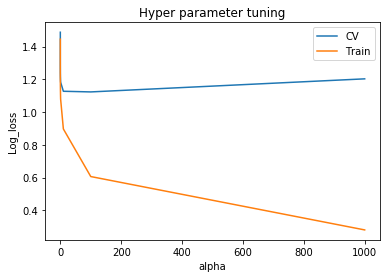

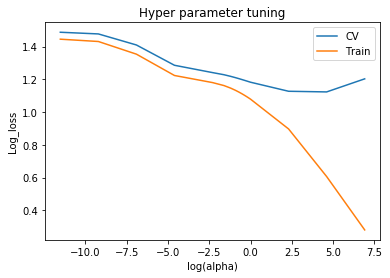

In [121]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [122]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


100


In [123]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
lr = LogisticRegression(penalty='l2',class_weight='balanced',C=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
lr.fit(X_train_tfidf_re, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=lr,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf_re,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf_re)
pred_tfidf_train = calibrated.predict(X_train_tfidf_re)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = lr.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf_re)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf_re)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf_re)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.0835103911539203
the log loss for train :0.4507990152125901
the log loss for cv :1.2840537210210843


-------------------- Confusion matrix --------------------


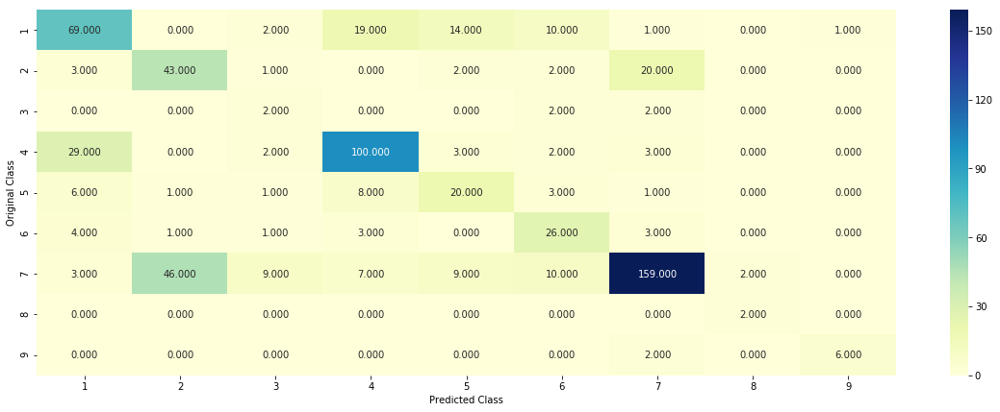

-------------------- Precision matrix (Columm Sum=1) --------------------


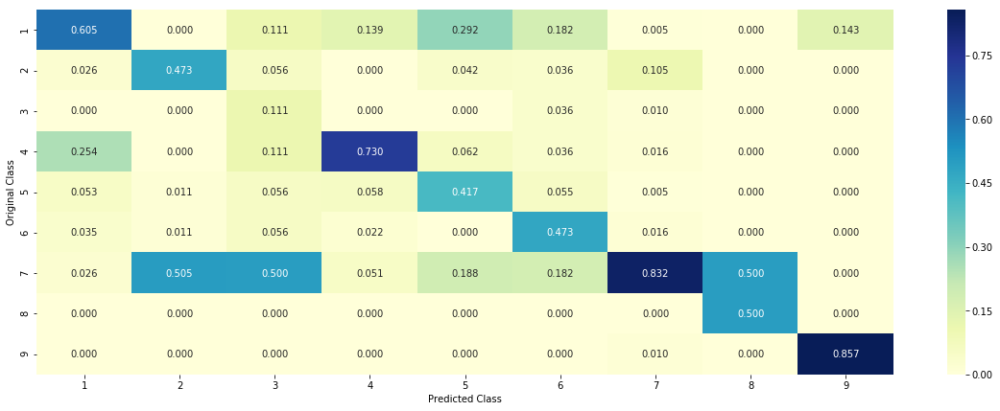

-------------------- Recall matrix (Row sum=1) --------------------


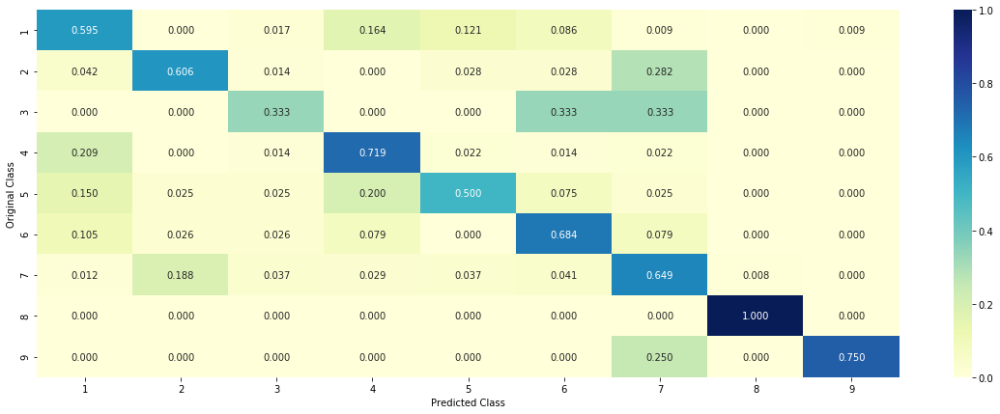

In [124]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [125]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['LR- Class Balancing','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.35789473684210527


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [126]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[1.99e-01 0.00e+00 1.00e-04 7.67e-02 7.10e-01 1.41e-02 0.00e+00 0.00e+00
  0.00e+00]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [127]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[0.0052 0.     0.0112 0.0455 0.8943 0.0438 0.     0.     0.    ]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h2>4.3. Logistic Regression without class balancing</h2>

In [128]:
from sklearn.linear_model  import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    lr=LogisticRegression(penalty='l2',C=i)
    
    # fitting the model on crossvalidation train
    lr.fit(X_train_tfidf_re, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(lr, method="sigmoid")
    calibrated.fit(X_train_tfidf_re, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf_re)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf_re)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:13<00:00,  1.78s/it]


{1e-05: 1.4690900992694895, 0.0001: 1.4593807314541039, 0.001: 1.3802502222869715, 0.01: 1.2585248925293793, 0.1: 1.261420019809673, 0.2: 1.2333252414757927, 0.3: 1.2182531794561327, 0.4: 1.2084744103785747, 0.5: 1.2011147871372825, 0.6: 1.1951434136224397, 0.7: 1.1901448555286531, 0.8: 1.1858513575915592, 0.9: 1.1820877176724225, 1: 1.1787636822303715, 10: 1.1240266770827505, 100: 1.1247400537184358, 1000: 1.2020328233641737}
{1e-05: 1.4398761870297243, 0.0001: 1.4288229687907943, 0.001: 1.3335915333322261, 0.01: 1.2200533816770007, 0.1: 1.1932690611078671, 0.2: 1.1610019082100107, 0.3: 1.142522922067132, 0.4: 1.1285617480118981, 0.5: 1.1168757636637574, 0.6: 1.1066487312036983, 0.7: 1.0975510961539752, 0.8: 1.0893567400552493, 0.9: 1.0818806419428957, 1: 1.075028159325592, 10: 0.8993697257137762, 100: 0.5990953386145338, 1000: 0.27291331899121374}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

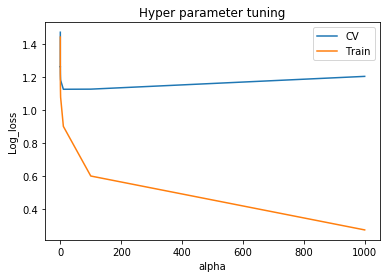

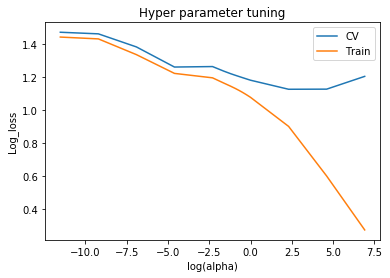

In [129]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [130]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


10


In [131]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
lr = LogisticRegression(penalty='l2',C=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
lr.fit(X_train_tfidf_re, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=lr,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf_re,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf_re)
pred_tfidf_train = calibrated.predict(X_train_tfidf_re)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = lr.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf_re)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf_re)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf_re)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.0296256010798805
the log loss for train :0.8401577663945726
the log loss for cv :1.1238649158567648


-------------------- Confusion matrix --------------------


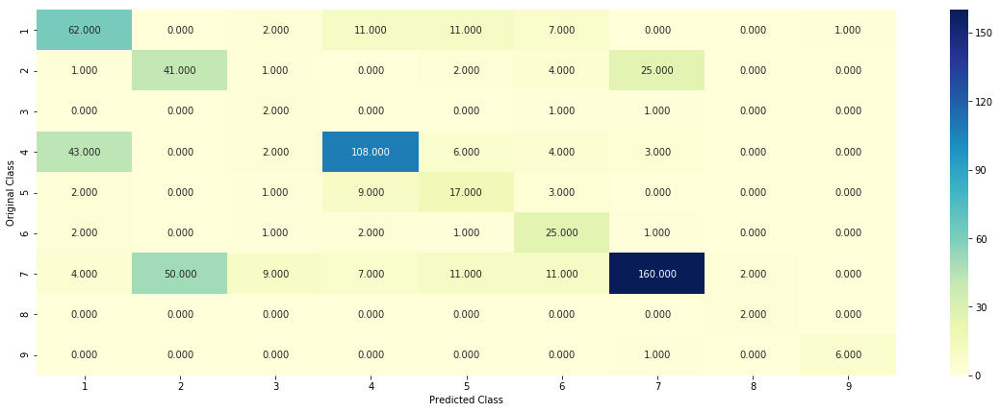

-------------------- Precision matrix (Columm Sum=1) --------------------


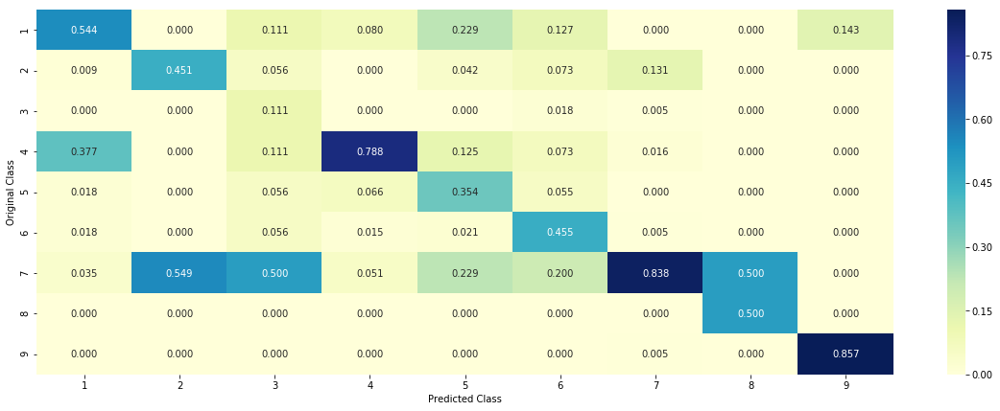

-------------------- Recall matrix (Row sum=1) --------------------


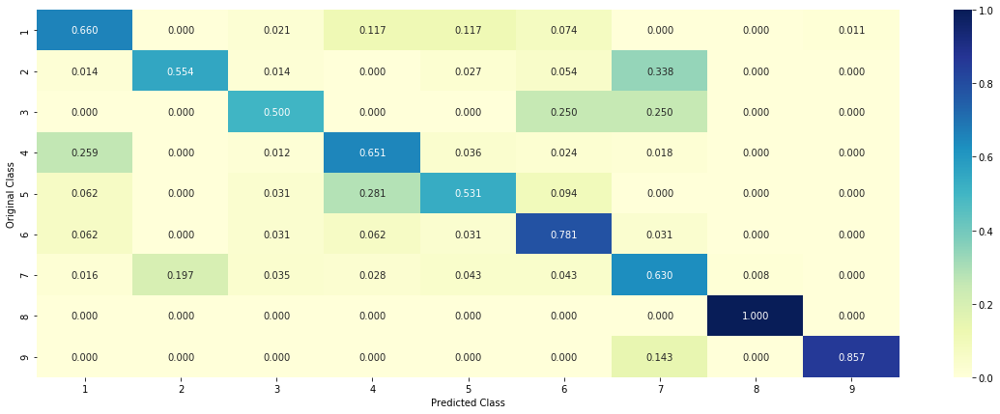

In [132]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [133]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['LR- NO Class Balancing','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.36390977443609024


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [134]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[2.464e-01 0.000e+00 1.040e-02 1.230e-01 5.587e-01 6.110e-02 0.000e+00
  2.000e-04 2.000e-04]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [135]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[1.030e-02 0.000e+00 1.063e-01 1.110e-01 7.372e-01 3.460e-02 0.000e+00
  3.000e-04 3.000e-04]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h2>4.4. Linear Support Vector Machines</h2>

In [136]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(alpha):
    # create instance of model
    svm=SGDClassifier(loss='hinge',penalty='l1', alpha=i)
    
    # fitting the model on crossvalidation train
    svm.fit(X_train_tfidf_re, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(svm, method="sigmoid")
    calibrated.fit(X_train_tfidf_re, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf_re)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_tfidf_re)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.08it/s]


{1e-05: 1.153076670359813, 0.0001: 1.2042743099932163, 0.001: 1.2582051475005294, 0.01: 1.328710455515562, 0.1: 1.586458683328716, 1: 1.8302599806265913, 10: 1.8302599806221207, 100: 1.8302599806220166, 1000: 1.8302599806220092, 10000: 1.8302599806220083}
{1e-05: 0.7685535693128052, 0.0001: 0.8533779313704623, 0.001: 1.0659104394827459, 0.01: 1.2224707431915525, 0.1: 1.5763271760060276, 1: 1.8317745288855758, 10: 1.8317745288816056, 100: 1.8317745288815137, 1000: 1.8317745288815075, 10000: 1.8317745288815068}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

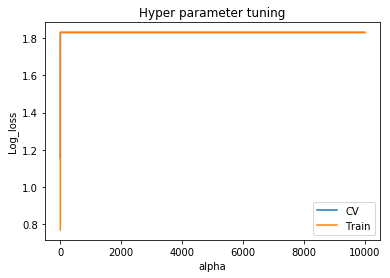

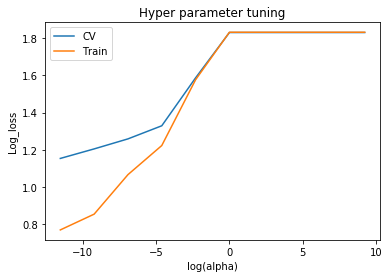

In [137]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [138]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


1e-05


In [139]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
svm = SGDClassifier(loss='hinge',penalty='l1',alpha=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
svm.fit(X_train_tfidf_re, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=svm,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf_re,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf_re)
pred_tfidf_train = calibrated.predict(X_train_tfidf_re)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = svm.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf_re)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf_re)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf_re)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))


the log loss for test :1.0971117677692042
the log loss for train :0.627204860434035
the log loss for cv :1.299808155681199


-------------------- Confusion matrix --------------------


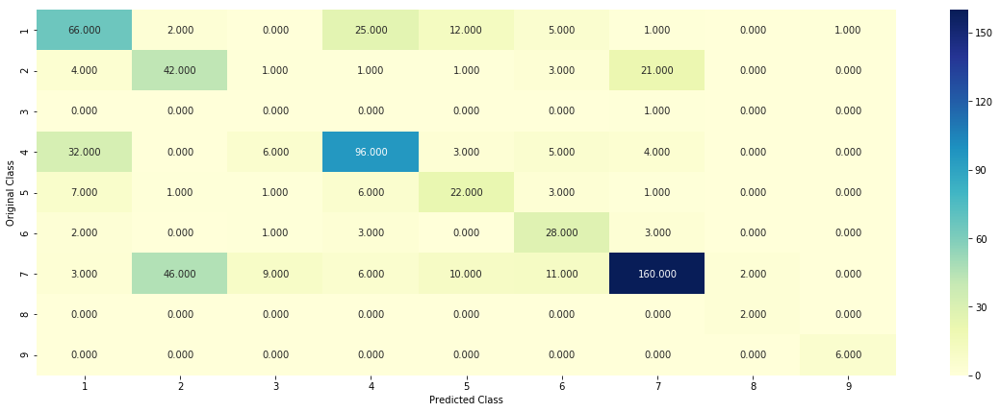

-------------------- Precision matrix (Columm Sum=1) --------------------


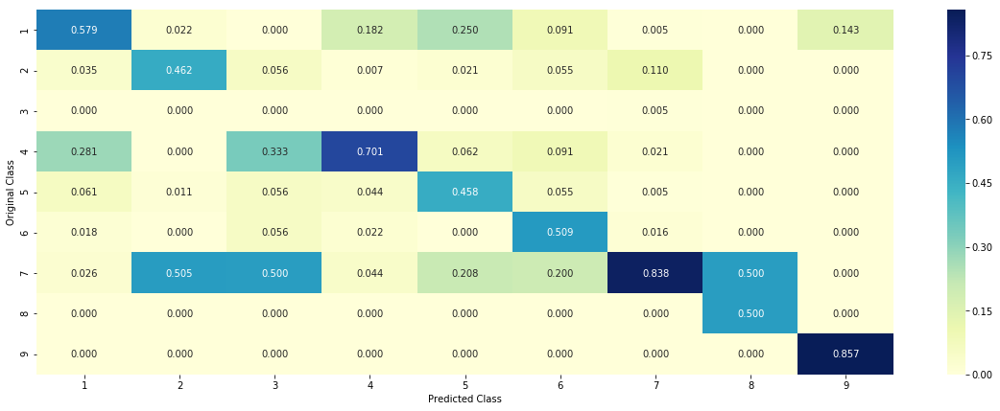

-------------------- Recall matrix (Row sum=1) --------------------


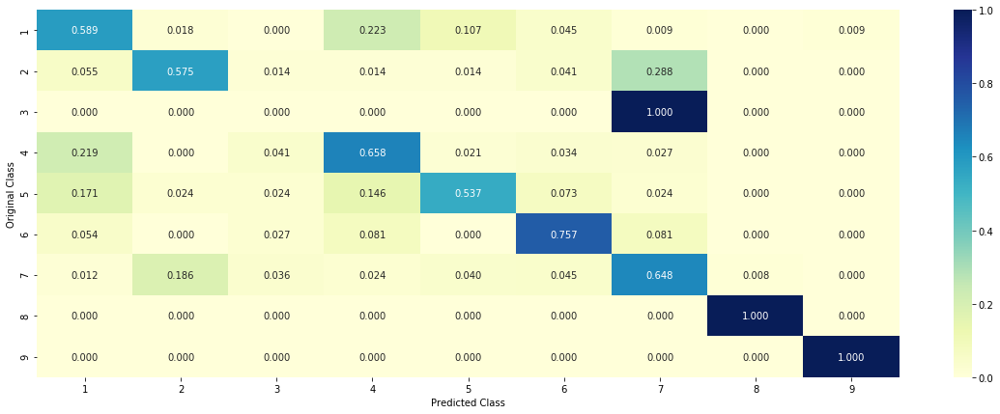

In [140]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [141]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['SVM','TFIDF-RE',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.36541353383458647


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [142]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")



Predicted Class : 5
Predicted Class Probabilities: [[0.0836 0.     0.     0.0331 0.8112 0.0721 0.     0.     0.    ]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [143]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[1.000e-04 0.000e+00 8.500e-03 1.100e-02 9.788e-01 1.600e-03 0.000e+00
  0.000e+00 0.000e+00]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


<h2>4.5 Random Forest Classifier</h2>

In [144]:
log_loss_cv_tfidf_dict=[]
log_loss_train_tfidf_dict=[]
           

for n in tqdm(range(1,5,1)):
    for d in range(10,50,10):
        #create instance of model
        rf=RandomForestClassifier(max_depth=d,n_estimators=n,n_jobs=-1,random_state=0)
        
        #Fit the model on the training set 
        rf.fit(X_train_tfidf_re,y_train)
        
        # fit the model to the calibrator
        calibrated = CalibratedClassifierCV(rf, method="sigmoid")
        calibrated.fit(X_train_tfidf_re, y_train)
        
        
        # predict the response on the crossvalidation train
        pred_tfidf_cv = calibrated.predict_proba(X_cv_tfidf_re)
    
        #evaluate CV log loss
        log_loss_cv=log_loss(y_cv,pred_tfidf_cv)


        #insert into dict
        log_loss_cv_tfidf_dict.append([n,d,log_loss_cv])


        # predict the response on the train
        pred_tfidf_train = calibrated.predict_proba(X_train_tfidf_re)

        #evaluate train roc_auc
        log_loss_train  =log_loss(y_train,pred_tfidf_train)

        #insert into dict
        log_loss_train_tfidf_dict.append([n,d,log_loss_train])

print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:20<00:00,  4.88s/it]


[[1, 10, 2.223828631449464], [1, 20, 2.072847496144578], [1, 30, 2.1662175940193626], [1, 40, 2.1662175940193626], [2, 10, 2.0736674762894625], [2, 20, 2.085896977526535], [2, 30, 2.070774332411691], [2, 40, 2.070774332411691], [3, 10, 1.7373805362645554], [3, 20, 1.6492268738772708], [3, 30, 1.5368140531413201], [3, 40, 1.5368140531413201], [4, 10, 1.4789107608165963], [4, 20, 1.4947496982334174], [4, 30, 1.3204847723631303], [4, 40, 1.3204847723631303]]
[[1, 10, 0.717506280814472], [1, 20, 0.5018611173376936], [1, 30, 0.4956313270986455], [1, 40, 0.4956313270986455], [2, 10, 0.47569054865796434], [2, 20, 0.33219146442483455], [2, 30, 0.3060385950499214], [2, 40, 0.3060385950499214], [3, 10, 0.39064190286749184], [3, 20, 0.26807186394713145], [3, 30, 0.25016271341934804], [3, 40, 0.25016271341934804], [4, 10, 0.32221800974455217], [4, 20, 0.23414498949183288], [4, 30, 0.2216917467268213], [4, 40, 0.2216917467268213]]


In [145]:
from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

x1=[]
y1=[]
z1=[]

x2=[]
y2=[]
z2=[]

for value in log_loss_cv_tfidf_dict:
    x1.append(value[0])
    y1.append(value[1])
    z1.append(value[2])
    
for value in log_loss_train_tfidf_dict:
    x2.append(value[0])
    y2.append(value[1])
    z2.append(value[2])
    
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'Cross val')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'train')
data = [trace1, trace2]

layout = go.Layout(title='Depth vs split size vs AUC(TFIDF)',scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')


In [146]:
from numpy import array

def find_optimal(input_list):
    optimal={}
    temp=pd.DataFrame(input_list)
    optimal_esti=int(temp[temp[2]==min(temp[2])].iloc[0][0])
    optimal_depth=int(temp[temp[2]==min(temp[2])].iloc[0][1])
    

    optimal['n_estimators']=optimal_esti
    optimal['max_depth']=optimal_depth

    return optimal

In [147]:
find_optimal(log_loss_cv_tfidf_dict)

{'n_estimators': 4, 'max_depth': 30}

In [148]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
rf = RandomForestClassifier(max_depth=find_optimal(log_loss_cv_tfidf_dict)['max_depth'],n_estimators=find_optimal(log_loss_cv_tfidf_dict)['n_estimators'],n_jobs=-1,random_state=0)

# fitting the model on crossvalidation train
rf.fit(X_train_tfidf_re, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=rf,method='sigmoid',cv='prefit')

calibrated.fit(X_train_tfidf_re,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_tfidf_re)
pred_tfidf_train = calibrated.predict(X_train_tfidf_re)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = rf.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_tfidf_re)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_tfidf_re)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_tfidf_re)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :2.319814932770567
the log loss for train :0.04849775880601006
the log loss for cv :2.6223144711078037


-------------------- Confusion matrix --------------------


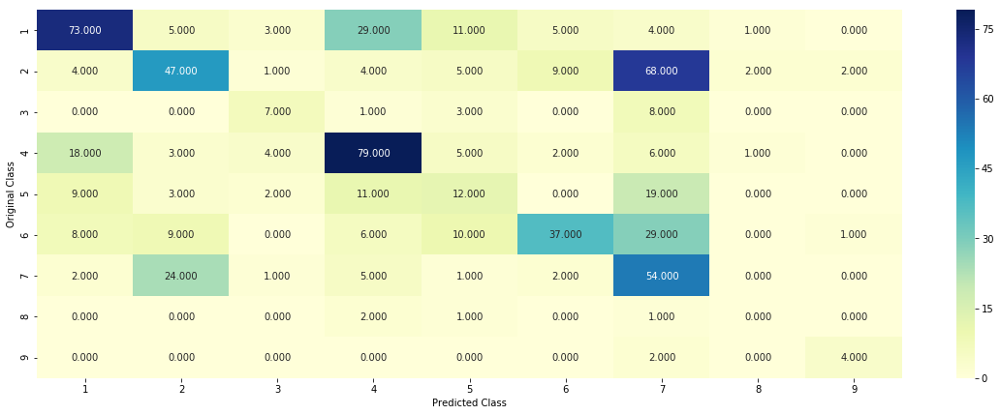

-------------------- Precision matrix (Columm Sum=1) --------------------


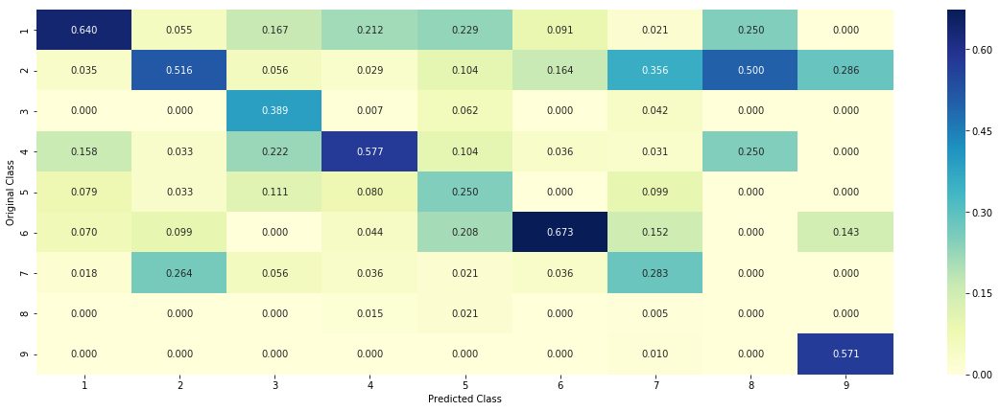

-------------------- Recall matrix (Row sum=1) --------------------


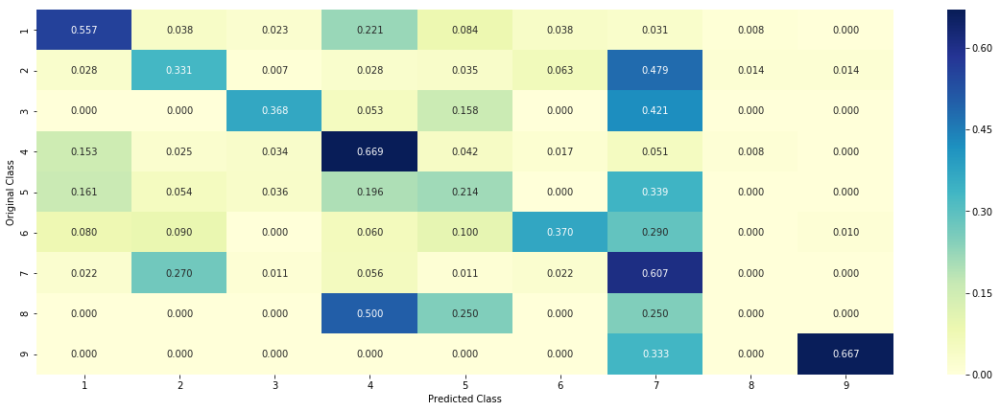

In [149]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [150]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['Random Forest','TFIDF-RE',find_optimal(log_loss_cv_tfidf_dict)['max_depth'],find_optimal(log_loss_cv_tfidf_dict)['n_estimators'],log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.5293233082706766


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [151]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 6
Predicted Class Probabilities: [[2.000e-04 1.000e-03 4.000e-04 3.000e-04 4.679e-01 5.290e-01 2.000e-04
  4.000e-04 6.000e-04]]
Actual Class : 5
[[  5 322   4   0  14  15   9  10   3  12]]
--------------------------------------------------
The top 10 features are:
Gene is important feature
Text is important feature
Gene is important feature
Gene is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Variation is important feature
Gene is important feature
Variation is important feature


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [152]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_tfidf_re[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_tfidf_re[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in indices[0]:
    if i<9:
        print("Gene is important feature")
    elif i<18:
        print("Variation is important feature")
    else:
        print("Text is important feature")


Predicted Class : 5
Predicted Class Probabilities: [[2.000e-04 1.200e-03 5.000e-04 4.382e-01 5.575e-01 1.000e-03 3.000e-04
  4.000e-04 7.000e-04]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:
Text is important feature
Gene is important feature
Gene is important feature
Gene is important feature
Text is important feature
Gene is important feature
Variation is important feature
Gene is important feature
Variation is important feature
Variation is important feature


## BOW with Uni grams and bi grams with Logistic Regression

<h2>4.3. Logistic Regression with class balancing</h2>

In [153]:
from sklearn.linear_model  import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    lr=LogisticRegression(penalty='l2',class_weight='balanced',C=i)
    
    # fitting the model on crossvalidation train
    lr.fit(X_train_bow_ohe, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(lr, method="sigmoid")
    calibrated.fit(X_train_bow_ohe, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_bow_ohe)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_bow_ohe)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████| 18/18 [7:57:15<00:00, 2270.34s/it]


{1e-05: 1.29662849824107, 0.0001: 1.181643576762939, 0.001: 1.1695200526040652, 0.01: 1.1934798113350167, 0.1: 1.2171364690465722, 0.2: 1.2218962549450485, 0.3: 1.2241984424810761, 0.4: 1.2257707420755117, 0.5: 1.2265187531484643, 0.6: 1.2274645002938904, 0.7: 1.2284640499806314, 0.8: 1.228842462064983, 0.9: 1.2294177521957614, 1: 1.2297542742602534, 10: 1.2366731821135604, 100: 1.2384490501243202, 1000: 1.2388820429516736}
{1e-05: 1.1254918203612012, 0.0001: 0.8613025119187375, 0.001: 0.7837773816032344, 0.01: 0.7915893148996027, 0.1: 0.8090634084903865, 0.2: 0.8118989945515179, 0.3: 0.8133808832988172, 0.4: 0.8148260775780893, 0.5: 0.8154227311321274, 0.6: 0.8156341723779192, 0.7: 0.8171061118807587, 0.8: 0.8165943568997617, 0.9: 0.8177554215835114, 1: 0.818054598882605, 10: 0.8380279233661844, 100: 0.8386367119881484, 1000: 0.8425674237783987}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

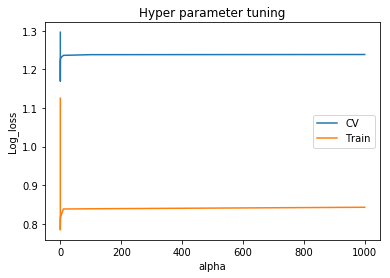

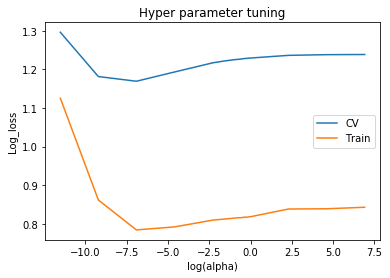

In [154]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [155]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


0.001


In [156]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
lr = LogisticRegression(penalty='l2',class_weight='balanced',C=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
lr.fit(X_train_bow_ohe, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=lr,method='sigmoid',cv='prefit')

calibrated.fit(X_train_bow_ohe,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_bow_ohe)
pred_tfidf_train = calibrated.predict(X_train_bow_ohe)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = lr.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_bow_ohe)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_bow_ohe)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_bow_ohe)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.6435880147400166
the log loss for train :0.31351133140119786
the log loss for cv :1.9616001975138289


-------------------- Confusion matrix --------------------


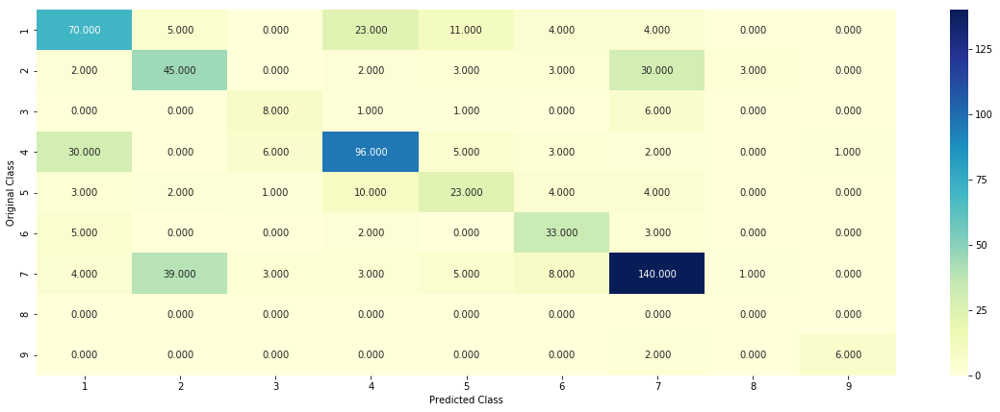

-------------------- Precision matrix (Columm Sum=1) --------------------


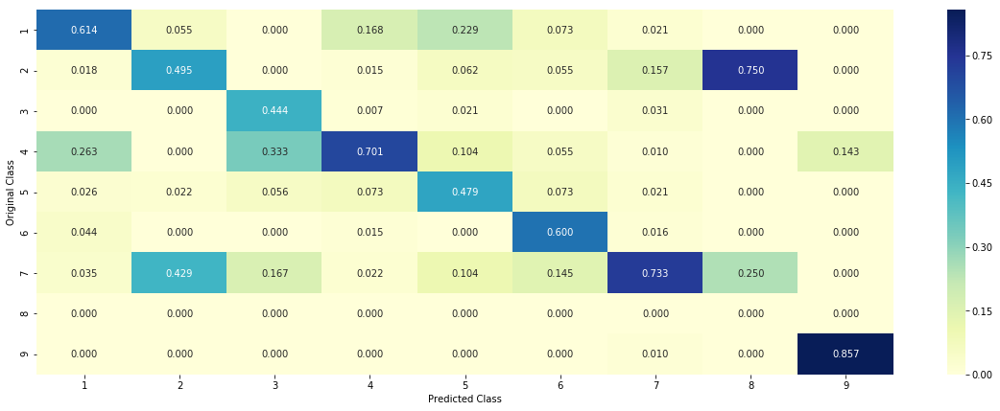

-------------------- Recall matrix (Row sum=1) --------------------


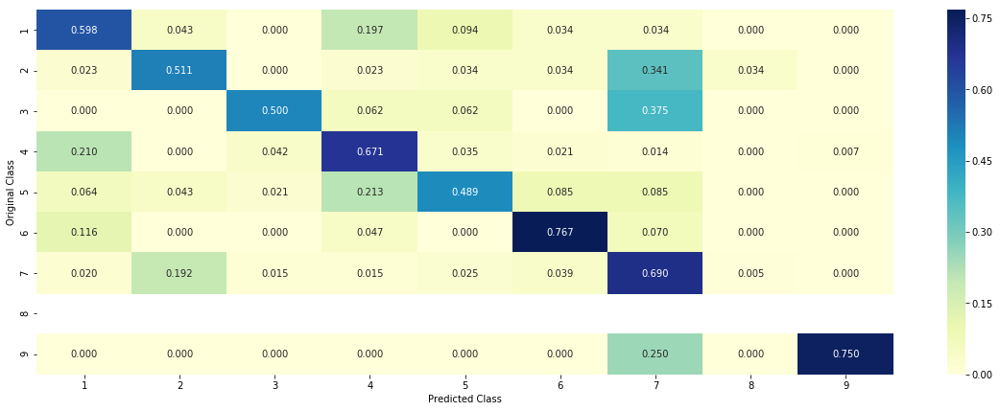

In [157]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [158]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['LR- Class Balancing','TFIDF',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.3669172932330827


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [160]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_bow_ohe[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_bow_ohe[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.170e-02 0.000e+00 1.000e-04 7.200e-03 9.806e-01 5.000e-04 0.000e+00
  0.000e+00 0.000e+00]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

a883f
akt2
akt3
abl1
k101m
akt1
arid5b
alk
arid2
aurka


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1002.73it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [161]:
test_point_index = 10
no_feature = 10
predicted_cls = calibrated.predict(X_test_bow_ohe[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_bow_ohe[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[0.0064 0.     0.0351 0.0989 0.8315 0.0281 0.     0.     0.    ]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

a883f
akt2
akt3
abl1
k101m
akt1
arid5b
alk
arid2
aurka


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1253.42it/s]


<h2>4.3. Logistic Regression without class balancing</h2>

In [162]:
from sklearn.linear_model  import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics.classification import accuracy_score, log_loss


log_loss_cv_tfidf_dict={}
log_loss_train_tfidf_dict={}


alpha=[0.00001,0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,10,100,1000,1000]
for i in tqdm(alpha):
    # create instance of model
    lr=LogisticRegression(penalty='l2',C=i)
    
    # fitting the model on crossvalidation train
    lr.fit(X_train_bow_ohe, y_train)
    
    # fit the model to the calibrator
    calibrated = CalibratedClassifierCV(lr, method="sigmoid")
    calibrated.fit(X_train_bow_ohe, y_train)
    
    # predict the response on the crossvalidation train
    pred_tfidf_cv = calibrated.predict_proba(X_cv_bow_ohe)
    
    #evaluate CV log loss
    log_loss_cv=log_loss(y_cv,pred_tfidf_cv)
    
    #insert into dict
    log_loss_cv_tfidf_dict[i]=log_loss_cv
    
    # predict the response on the train
    pred_tfidf_train = calibrated.predict_proba(X_train_bow_ohe)
    
    #evaluate train roc_auc
    log_loss_train =log_loss(y_train,pred_tfidf_train)
    
    #insert into dict
    log_loss_train_tfidf_dict[i]=log_loss_train
    
    
    
print(log_loss_cv_tfidf_dict)
print(log_loss_train_tfidf_dict)


100%|██████████████████████████████████████████████████████████████████████████████| 18/18 [9:22:30<00:00, 3096.53s/it]


{1e-05: 1.2800726118188424, 0.0001: 1.1684662975447677, 0.001: 1.1652029768667993, 0.01: 1.1930533595272947, 0.1: 1.2180473284774587, 0.2: 1.2233959063139281, 0.3: 1.225762081905784, 0.4: 1.2276829040467785, 0.5: 1.2285635529131471, 0.6: 1.2295570637037936, 0.7: 1.2302910089300874, 0.8: 1.2316974329745023, 0.9: 1.2319619544690477, 1: 1.232067286702324, 10: 1.244817875503663, 100: 1.245587321260072, 1000: 1.2447890868881673}
{1e-05: 1.107632715754229, 0.0001: 0.8533839129755659, 0.001: 0.7835537804440028, 0.01: 0.7945890064542268, 0.1: 0.8125233653306906, 0.2: 0.8155326287122262, 0.3: 0.817320685734908, 0.4: 0.8186934917360725, 0.5: 0.8192950277829965, 0.6: 0.8198214716839344, 0.7: 0.8207216546191675, 0.8: 0.8218046792543806, 0.9: 0.8215923833898459, 1: 0.8224514205281493, 10: 0.8435630717244049, 100: 0.8447759579842529, 1000: 0.8384475574476979}


### Plot ROC_AUC_score VS different alpha values (Train and CV set)

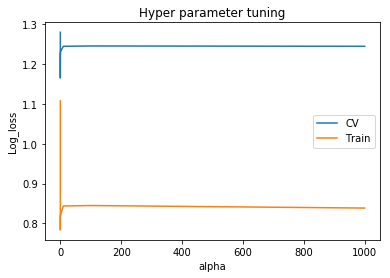

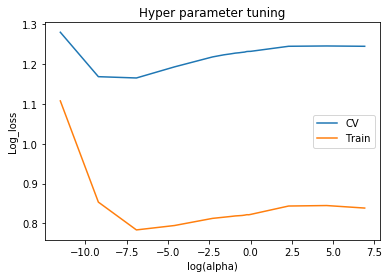

In [163]:
#https://stackoverflow.com/questions/37266341/plotting-a-python-dict-in-order-of-key-values/37266356
import math

lists1 = sorted(log_loss_cv_tfidf_dict.items())
x1, y1 = zip(*lists1) # unpack a list of pairs into two tuples
lists2 = sorted(log_loss_train_tfidf_dict.items())
x2, y2 = zip(*lists2) # unpack a list of pairs into two tuples
plt.xlabel('alpha')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()

x1=[math.log(i) for i in list(x1)]
x2=[math.log(i) for i in list(x2)]
plt.xlabel('log(alpha)')
plt.ylabel('Log_loss')
plt.title('Hyper parameter tuning')
plt.plot(x1, y1,label="CV")
plt.plot(x2, y2,label='Train')
plt.legend()
plt.show()


In [164]:
###  Find best alpha
print(find_highest_alpha(log_loss_cv_tfidf_dict))


0.001


In [165]:
from sklearn.metrics.classification import accuracy_score, log_loss
# train model on the best alpha
lr = LogisticRegression(penalty='l2',C=find_highest_alpha(log_loss_cv_tfidf_dict))

# fitting the model on crossvalidation train
lr.fit(X_train_bow_ohe, y_train)

# fit the model to the calibrator
calibrated = CalibratedClassifierCV(base_estimator=lr,method='sigmoid',cv='prefit')

calibrated.fit(X_train_bow_ohe,y_train)


# predict the response on the crossvalidation train
pred_tfidf_test = calibrated.predict(X_test_bow_ohe)
pred_tfidf_train = calibrated.predict(X_train_bow_ohe)


#https://stackoverflow.com/questions/52910061/implementing-roc-curves-for-k-nn-machine-learning-algorithm-using-python-and-scip_scores = lr.predict_proba(X_test)
pred_tfidf_test_scores=calibrated.predict_proba(X_test_bow_ohe)
pred_tfidf_train_scores=calibrated.predict_proba(X_train_bow_ohe)
pred_tfidf_cv_scores=calibrated.predict_proba(X_cv_bow_ohe)

log_loss_test=log_loss(y_test,pred_tfidf_test_scores)
log_loss_train=log_loss(y_train,pred_tfidf_train_scores)
log_loss_cv=log_loss(y_cv,pred_tfidf_cv_scores)



print("the log loss for test :{}".format(log_loss_test))
print("the log loss for train :{}".format(log_loss_train))
print("the log loss for cv :{}".format(log_loss_cv))



the log loss for test :1.7078542992798542
the log loss for train :0.3001407917336384
the log loss for cv :2.004660683709171


-------------------- Confusion matrix --------------------


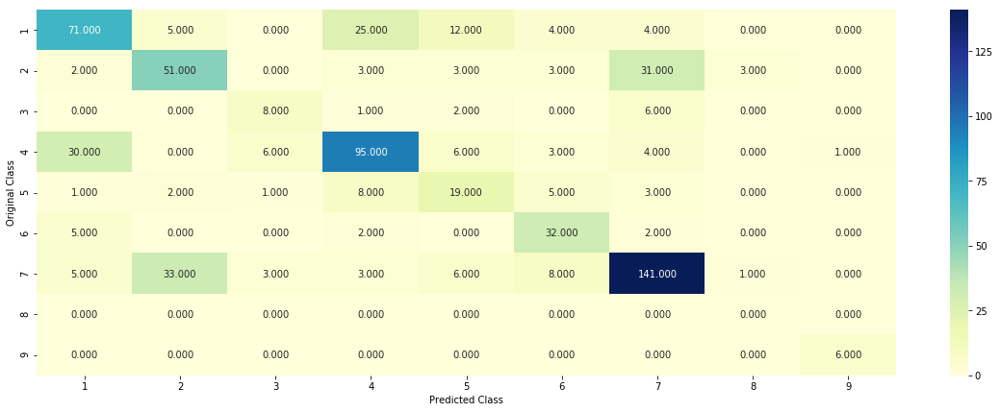

-------------------- Precision matrix (Columm Sum=1) --------------------


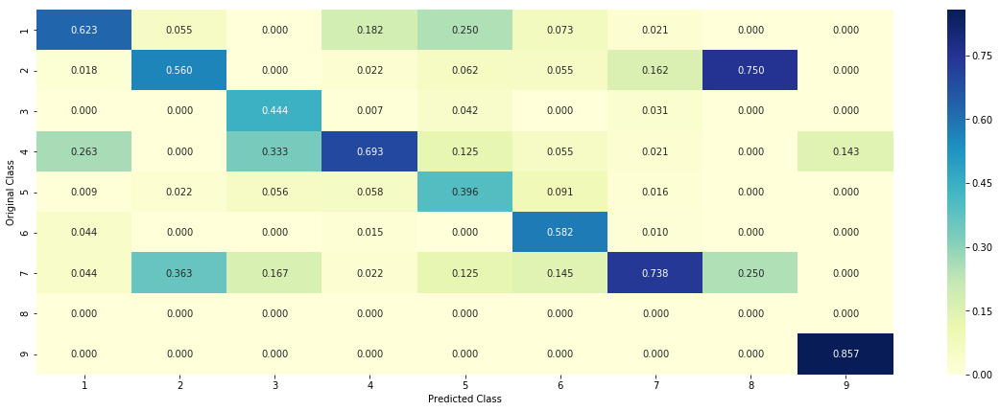

-------------------- Recall matrix (Row sum=1) --------------------


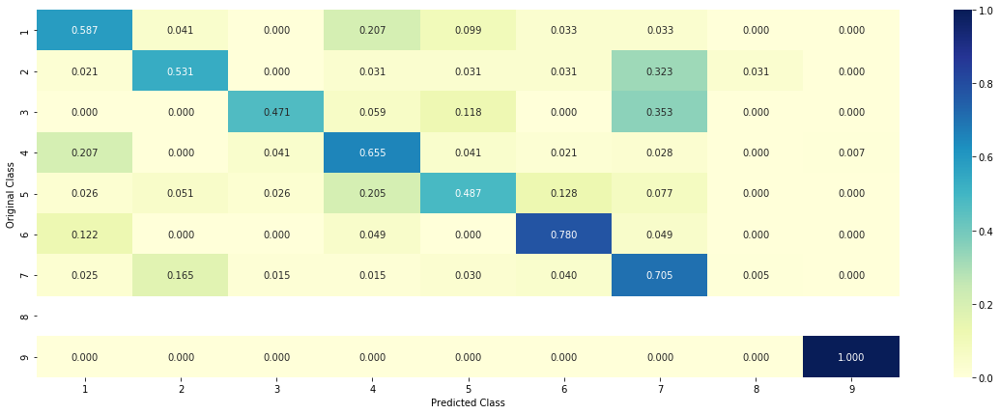

In [166]:
plot_confusion_matrix(pred_tfidf_test,y_test )

In [167]:
mis_class=np.count_nonzero((pred_tfidf_test- y_test))/y_test.shape[0]
print("% of missclassified point :",mis_class)

summary.append(['LR- NO Class Balancing','TFIDF',find_highest_alpha(log_loss_cv_tfidf_dict),'NA',log_loss_train,log_loss_test,log_loss_cv,mis_class])


% of missclassified point : 0.36390977443609024


<h4>4.1.1.3. Feature Importance, Correctly classified point</h4>

In [172]:
test_point_index = 1
no_feature = 10
predicted_cls = calibrated.predict(X_test_bow_ohe[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_bow_ohe[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 5
Predicted Class Probabilities: [[1.530e-02 0.000e+00 3.000e-04 8.500e-03 9.754e-01 5.000e-04 0.000e+00
  0.000e+00 0.000e+00]]
Actual Class : 5
[[322   4   5   0 994   3  13   6  12  15]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

a883f
akt2
akt3
abl1
k101m
akt1
arid5b
alk
arid2
aurka


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.17it/s]


<h4>4.1.1.4. Feature Importance, Incorrectly classified point</h4>

In [173]:
test_point_index = 2
no_feature = 10
predicted_cls = calibrated.predict(X_test_bow_ohe[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(calibrated.predict_proba(X_test_bow_ohe[test_point_index]),4))
print("Actual Class :", y_test[test_point_index])
indices = np.argsort(-nb.coef_)[predicted_cls-1][:,:no_feature]
print(indices)
print("-"*50)
print("The top 10 features are:")
for i in tqdm(indices[0]):
    print(feature_names_tfidf[i])


Predicted Class : 2
Predicted Class Probabilities: [[8.950e-02 8.591e-01 3.600e-03 1.320e-02 1.570e-02 1.720e-02 6.000e-04
  8.000e-04 3.000e-04]]
Actual Class : 1
[[ 6  1 10 15 14  9 16 13 17 11]]
--------------------------------------------------
The top 10 features are:


  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

alk
acvr1
arid1a
aurka
atm
araf
aurkb
arid5b
axl
arid1b


100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 1250.02it/s]


In [170]:
# Please compare all your models using Prettytable library
from prettytable import PrettyTable

x = PrettyTable()

x.field_names = ["Vectorizer","DataSet","Hp1","Hp2", "logloss_train","logloss_test", "logloss_cv","mis_class"]

for each in summary:
    x.add_row(each)

print(x)

+------------------------+----------+--------+-----+----------------------+--------------------+--------------------+---------------------+
|       Vectorizer       | DataSet  |  Hp1   | Hp2 |    logloss_train     |    logloss_test    |     logloss_cv     |      mis_class      |
+------------------------+----------+--------+-----+----------------------+--------------------+--------------------+---------------------+
|      Navie Bayes       | TFIDF-RE |  0.4   |  NA |  0.4317443668191243  | 1.2219867347993427 | 1.4028764585399225 |  0.3954887218045113 |
|     K-NN Classifer     | TFIDF-RE |   5    |  NA |  0.6550458741562593  | 1.107954300123613  | 1.2011588304439524 |  0.3684210526315789 |
|  LR- Class Balancing   |  TFIDF   |   10   |  NA | 0.03607480471624782  | 1.636925456519765  | 1.9517282836827916 |  0.3924812030075188 |
| LR- NO Class Balancing |  TFIDF   |   10   |  NA | 0.027012190901983375 | 1.6526129875239222 | 1.9638687613349126 |  0.3879699248120301 |
|          SVM      